# Air quality analysis - Utrecht

Submitted by Pitchaporn Likitpanjamanon (s3234223)

In [1]:
import geopandas as gpd
import json 
import requests
import pandas as pd
import numpy as np
import folium
import fiona as fio
import re
import matplotlib.pyplot as plt
import os
import rasterio
from osgeo import gdal
import branca.colormap as cm
from matplotlib import colors as colors
from utils.utils import *
import scipy
import seaborn as sns

## Get base data of utrecht
- municipalty and wijken(subarea) boundary
- land use
- bike path

### Municipality boundary

I commented some code blocks (get data from pdok API) to prevent re-running it.

In [2]:
# Get boundary (one time execution)
# api_base_url = 'https://service.pdok.nl'
# api_path = '/cbs/wijkenbuurten/2022/wfs/v1_0'
# api_service = 'WFS'
# api_request = 'GetFeature'
# api_version = '2.0.0'
# api_typename = 'wijkenbuurten:gemeenten'
# api_srs = 'urn:ogc:def:crs:EPSG::28992'
# api_filter = '<Filter><PropertyIsEqualTo><PropertyName>gemeentenaam</PropertyName><Literal>Utrecht</Literal></PropertyIsEqualTo></Filter>'
# api_output_format = 'application/json'

# try:
#     r = requests.get(api_base_url+api_path, params={
#         'SERVICE': api_service,
#         'REQUEST': api_request,
#         'VERSION': api_version,
#         'TYPENAMES': api_typename,
#         'SRSNAME': api_srs,
#         'FILTER': api_filter,
#         'outputFormat': api_output_format
#     })

#     r.raise_for_status()
    
#     utrecht_boundary = gpd.read_file(r.text, driver='GeoJSON')
#     utrecht_boundary.plot()
# except requests.exceptions.RequestException as e:
#     print(f"Error fetching data: {e}")

In [3]:
# Save to geojson file (one time execution)
# utrecht_boundary.to_file("data/utrecht_boundary.geojson", driver='GeoJSON')

In [4]:
utrecht_boundary = gpd.read_file("data/utrecht_boundary.geojson")

In [5]:
# Inspect data
utrecht_boundary

,id,gemeentecode,gemeentenaam,water,omgevingsadressendichtheid,stedelijkheidAdressenPerKm2,bevolkingsdichtheidInwonersPerKm2,aantalInwoners,mannen,vrouwen,...,percentageUitNederlandseAntillenEnAruba,percentageUitSuriname,percentageUitTurkije,percentageOverigeNietwestersemigratieachtergrond,oppervlakteTotaalInHa,oppervlakteLandInHa,oppervlakteWaterInHa,jrstatcode,jaar,geometry
0,gemeenten.f5501563-7261-48d3-a296-a0e7709321c1,GM0344,Utrecht,NEE,3532,1,3857,361699,177445,184254,...,1,2,4,9,9921,9377,544,2022GM0344,2022,"MULTIPOLYGON (((135347.837 460261.864, 135371...."


In [6]:
# Get Utrecht bbox
utrecht_boundary.bounds

,minx,miny,maxx,maxy
0,126434.772,448709.995,141834.432,461609.608


<Axes: >

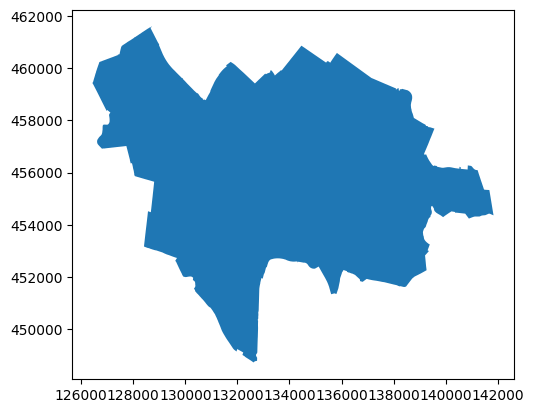

In [7]:
utrecht_boundary.plot()

### Wijken(subarea) boundary

In [8]:
# Get subareas boundary (one time execution)
# api_base_url = 'https://service.pdok.nl'
# api_path = '/cbs/wijkenbuurten/2022/wfs/v1_0'
# api_service = 'WFS'
# api_request = 'GetFeature'
# api_version = '2.0.0'
# api_typename = 'wijkenbuurten:wijken'
# api_srs = 'urn:ogc:def:crs:EPSG::28992'
# api_filter = '<Filter><PropertyIsEqualTo><PropertyName>gemeentenaam</PropertyName><Literal>Utrecht</Literal></PropertyIsEqualTo></Filter>'
# api_output_format = 'application/json'

# try:
#     r = requests.get(api_base_url+api_path, params={
#         'SERVICE': api_service,
#         'REQUEST': api_request,
#         'VERSION': api_version,
#         'TYPENAMES': api_typename,
#         'SRSNAME': api_srs,
#         'FILTER': api_filter,
#         'outputFormat': api_output_format
#     })

#     r.raise_for_status()
    
#     utrecht_wijken_boundary = gpd.read_file(r.text, driver='GeoJSON')
#     utrecht_wijken_boundary.plot()
# except requests.exceptions.RequestException as e:
#     print(f"Error fetching data: {e}")

In [9]:
# Save to geojson file (one time execution)
# utrecht_wijken_boundary.to_file("data/utrecht_wijken_boundary.geojson", driver='GeoJSON')

In [10]:
utrecht_wijken_boundary = gpd.read_file("data/utrecht_wijken_boundary.geojson")

In [11]:
# Inspect data
utrecht_wijken_boundary.head()

,id,wijkcode,wijknaam,gemeentecode,gemeentenaam,indelingswijzigingWijkenEnBuurten,water,omgevingsadressendichtheid,stedelijkheidAdressenPerKm2,bevolkingsdichtheidInwonersPerKm2,...,percentageUitNederlandseAntillenEnAruba,percentageUitSuriname,percentageUitTurkije,percentageOverigeNietwestersemigratieachtergrond,oppervlakteTotaalInHa,oppervlakteLandInHa,oppervlakteWaterInHa,jrstatcode,jaar,geometry
0,wijken.706cc425-0c6f-4593-9f2f-458f4ba5c3b4,WK034407,Wijk 07 Zuid,GM0344,Utrecht,1,NEE,3291,1,5994,...,1,2,2,9,473,459,14,2022WK034407,2022,"MULTIPOLYGON (((136758.599 451819.906, 136748...."
1,wijken.63e1d807-1e3b-4bb8-b2b6-06b165706d32,WK034408,Wijk 08 Zuidwest,GM0344,Utrecht,1,NEE,3747,1,7815,...,1,2,8,11,555,506,49,2022WK034408,2022,"MULTIPOLYGON (((134991.265 452787.384, 134806...."
2,wijken.db249b6e-8719-4ff3-b0ea-822abfe2fcaf,WK034404,Wijk 04 Noordoost,GM0344,Utrecht,1,NEE,4581,1,8040,...,1,1,1,5,507,496,12,2022WK034404,2022,"MULTIPOLYGON (((137147.564 456649.847, 137144...."
3,wijken.2ebdf75b-a4dc-4be8-a98f-bd0fbe4253b0,WK034406,Wijk 06 Binnenstad,GM0344,Utrecht,1,NEE,5736,1,7353,...,1,1,1,8,271,259,11,2022WK034406,2022,"MULTIPOLYGON (((136662.330 454643.094, 136628...."
4,wijken.2ed693a3-81b2-42ea-bd5c-7438cbbd90c4,WK034402,Wijk 02 Noordwest,GM0344,Utrecht,1,NEE,4096,1,10143,...,1,2,5,7,453,439,14,2022WK034402,2022,"MULTIPOLYGON (((134596.763 457269.498, 134500...."


### Get Utrecht bike path

Import data from downloaded shapefile from geofabrik website.

I commented some code blocks to prevent re-running it since it is one time execution.

In [12]:
# Read data from shape file
# bike_data_path = 'data/utrecht-latest/gis_osm_roads_free_1.shp'
# utrecht_bikepath = gpd.read_file(bike_data_path)

In [13]:
# Inspect data
# utrecht_bikepath.head()

In [14]:
# utrecht_bikepath['fclass'].unique()

In [15]:
# Filter cycleway
# utrecht_bikepath = utrecht_bikepath[utrecht_bikepath['fclass'] == 'cycleway']

In [16]:
# Clipped Utrecht bike path
# utrecht_bikepath = utrecht_bikepath.to_crs(28992)
# clipped_utrecht_bikepath = gpd.clip(utrecht_bikepath, utrecht_boundary)
# clipped_utrecht_bikepath.plot()

In [17]:
# Save utrecht bikepath file
# clipped_utrecht_bikepath.to_file("data/utrecht_bikepath.geojson", driver='GeoJSON')

In [18]:
clipped_utrecht_bikepath = gpd.read_file("data/utrecht_bikepath.geojson")

<Axes: >

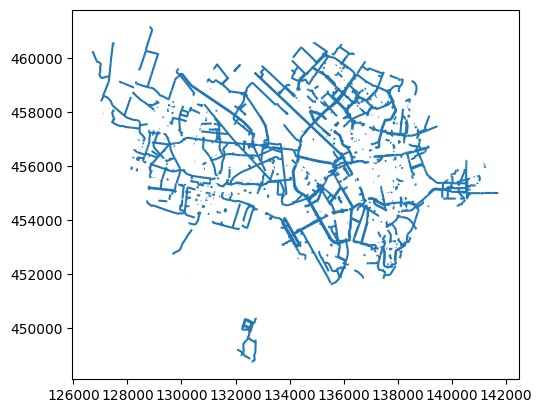

In [19]:
clipped_utrecht_bikepath.plot()

### Get Utrecht existing land use data

I commented some code blocks to prevent re-running it since it is one time execution.

In [20]:
# Get Utrecht existing land use data
# api_base_url = 'https://service.pdok.nl'
# api_path = '/cbs/landuse/wfs/v1_0'
# api_service = 'WFS'
# api_request = 'GetFeature'
# api_version = '2.0.0'
# api_typename = 'landuse:ExistingLandUse'
# api_srs = 'urn:ogc:def:crs:EPSG::28992'
# api_output_format = 'application/json'
# bbox = "126434.772,448709.995,141834.432,461609.608,EPSG:28992"

# try:
#     r = requests.get(api_base_url+api_path, params={
#         'SERVICE': api_service,
#         'REQUEST': api_request,
#         'VERSION': api_version,
#         'TYPENAMES': api_typename,
#         'SRSNAME': api_srs,
#         'outputFormat': api_output_format,
#         'BBOX': bbox
#     })

#     r.raise_for_status()
    
#     utrecht_lu = gpd.read_file(r.text, driver='GeoJSON')
# except requests.exceptions.RequestException as e:
#     print(f"Error fetching data: {e}")

In [21]:
# utrecht_lu = gpd.read_file(r.text, driver='GeoJSON')
# clipped_utrecht_lu = gpd.clip(utrecht_lu, utrecht_boundary)
# clipped_utrecht_lu.plot()

In [22]:
# Save it to geojson file (one time execution)
# clipped_utrecht_lu.to_file("data/utrecht_lu.geojson", driver='GeoJSON')

In [23]:
clipped_utrecht_lu = gpd.read_file("data/utrecht_lu.geojson")

In [24]:
clipped_utrecht_lu['description'].unique()

array(['Main road', 'Retail trade, hotel and catering',
       'Park and public garden', 'Residential', 'Socio-cultural facility',
       'Industrial area and offices', 'Cemetery', 'Building site',
       'Public institutions', 'Railroad'], dtype=object)

In [25]:
clipped_utrecht_lu['specificlanduseTitle'].unique()

array(['Hoofdweg_Hoofdweg',
       'Bebouwd exclusief bedrijfsterrein_Detailhandel en horeca',
       'Recreatie_Park en plantsoen',
       'Bebouwd exclusief bedrijfsterrein_Woongebied',
       'Bebouwd exclusief bedrijfsterrein_Sociaal-culturele voorziening',
       'Bedrijfsterrein_Bedrijfsterrein', 'Semi-bebouwd_Begraafplaats',
       'Semi-bebouwd_Bouwterrein',
       'Bebouwd exclusief bedrijfsterrein_Openbare voorziening',
       'Spoorterrein_Spoorterrein'], dtype=object)

<Axes: >

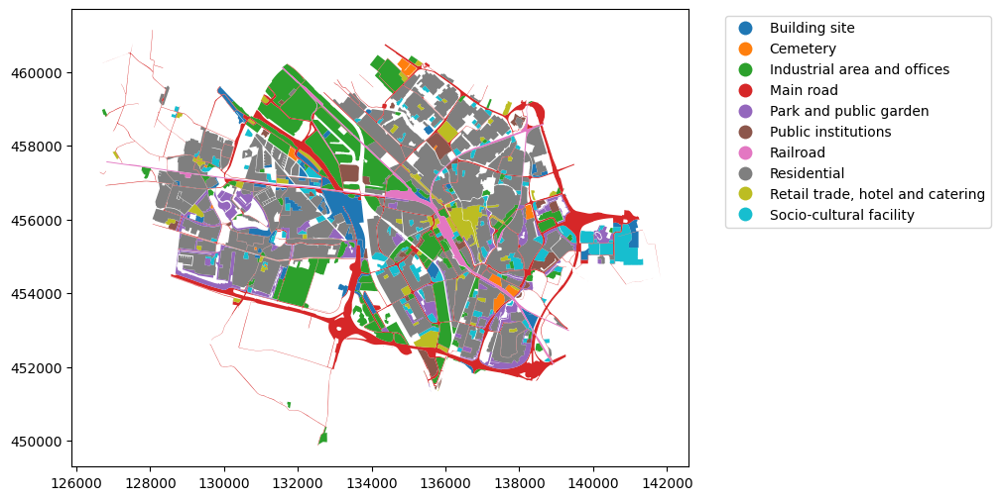

In [26]:
clipped_utrecht_lu.plot(column='description', 
                        figsize=(10,6), 
                        legend=True, 
                        legend_kwds={'loc': 'upper right', 'bbox_to_anchor':(1.5, 1)})

## Get Air pollution data

**Data Sources:**
- Samenmeten (community+official)
- luchtmeetnet (official station)

**Air quality in NL**
  
Details: https://www.luchtmeetnet.nl/informatie/luchtkwaliteit/luchtkwaliteitsindex-(lki)

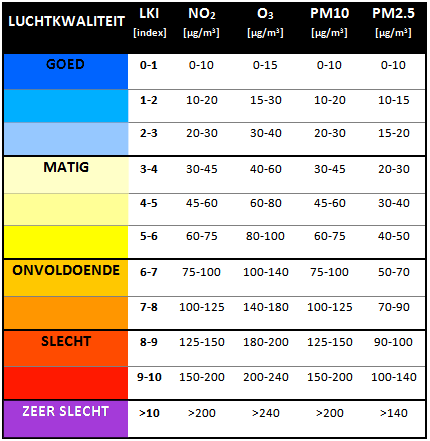

1. GOOD
2. MODERATE
3. INSUFFICIENT
4. BAD
5. VERY BAD

Ref: https://www.luchtmeetnet.nl/informatie/luchtkwaliteit/gezondheidsadviezen

### Data from Samenmeten

#### Things data and location

I queried Things in Utrecht by using **Gemeente code** which I got from pdok API (get municipality boundary) response.

In [27]:
# Get Things data and location in Utrecht
all_data = {"value": []}
api_base_url = 'https://api-samenmeten.rivm.nl/v1.0'
api_path = '/Things'

while True:
    try:
        if all_data == {"value": []}:
            r = requests.get(api_base_url+api_path, params={
                '$expand': 'Locations,Datastreams/Sensor,Datastreams/ObservedProperty',
                '$filter': "properties/codegemeente eq '344'"
            })
            r.raise_for_status()
            data_json = json.loads(r.text)
        else:
            if "@iot.nextLink" in data_json:
                r = requests.get(data_json['@iot.nextLink'])
                r.raise_for_status()
                data_json = json.loads(r.text)            
            else:
                break
        for item in data_json['value']:
            item.setdefault('Locations', [])
            item.setdefault('Datastreams', [])
            all_data['value'].append(item)
    except r.exceptions.RequestException as e:
        print(f"Error fetching data: {e}")
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")

In [28]:
things_df = pd.json_normalize(all_data, record_path=['value', 'Locations'], record_prefix='loc.')

In [29]:
print("Number of Things in Utrecht:", len(things_df))

Number of Things in Utrecht: 257


In [30]:
things_df = pd.concat([things_df, pd.json_normalize(all_data, record_path=['value'])], axis=1)

In [31]:
things_df = things_df.drop(columns=['loc.@iot.selfLink', 
                                    'loc.Things@iot.navigationLink', 
                                    'loc.name', 
                                    'loc.description', 
                                    'loc.encodingType', 
                                    'loc.HistoricalLocations@iot.navigationLink', 
                                    '@iot.selfLink', 
                                    'HistoricalLocations@iot.navigationLink', 
                                    'properties.nh3closecode',
                                    'properties.nh3regiocode',
                                    'properties.nh3stadcode',
                                    'properties.pm10closecode',
                                    'properties.pm10regiocode',
                                    'properties.pm10stadcode',
                                    'Locations@iot.navigationLink',
                                    'Locations'])

In [32]:
things_df['lon'] = things_df['loc.location.coordinates'].str[0]
things_df['lat'] = things_df['loc.location.coordinates'].str[1]

In [33]:
things_geodf = gpd.GeoDataFrame(things_df, geometry=gpd.points_from_xy(things_df['lon'], things_df['lat'], crs='EPSG:4326'))
things_geodf = things_geodf.to_crs(28992)

In [34]:
things_geodf

,loc.@iot.id,loc.location.coordinates,loc.location.type,@iot.id,name,description,Datastreams,properties.codegemeente,properties.knmicode,properties.no2closecode,...,properties.no2stadcode,properties.owner,properties.pm25closecode,properties.pm25regiocode,properties.pm25stadcode,properties.project,properties.gemeentecode,lon,lat,geometry
0,27897.0,"[5.084, 52.079]",Point,8713,MJS_606,MJS_606,"[{'@iot.id': 44314, '@iot.selfLink': 'https://...",344,knmi_06260,NL10639,...,NL10639,Meetjestad,NL10636,NL10644,NL10636,Meetjestad,NaN,5.084,52.079,POINT (134215.170 454568.457)
1,27499.0,"[5.128, 52.07]",Point,8618,LTD_74486,LTD_74486,"[{'@iot.id': 43807, '@iot.selfLink': 'https://...",344,knmi_06260,NL10639,...,NL10639,Luftdaten,NL10643,NL10644,NL10636,Luftdaten,NaN,5.128,52.070,POINT (137227.823 453555.454)
2,27406.0,"[5.128, 52.101]",Point,8578,GLBPB_NL10643,GLBPB_NL10643,"[{'@iot.id': 43726, '@iot.selfLink': 'https://...",344,knmi_06260,NL10643,...,NL10636,Globe,NL10643,NL10644,NL10636,Palmes,NaN,5.128,52.101,POINT (137240.131 457004.470)
3,27404.0,"[5.12, 52.068]",Point,8576,GLBPB_NL10639,GLBPB_NL10639,"[{'@iot.id': 43724, '@iot.selfLink': 'https://...",344,knmi_06260,NL10639,...,NL10639,Globe,NL10643,NL10644,NL10636,Palmes,NaN,5.120,52.068,POINT (136678.489 453334.925)
4,27403.0,"[5.125, 52.105]",Point,8575,GLBPB_NL10636,GLBPB_NL10636,"[{'@iot.id': 43723, '@iot.selfLink': 'https://...",344,knmi_06260,NL10636,...,NL10636,Globe,NL10636,NL10644,NL10636,Palmes,NaN,5.125,52.105,POINT (137036.187 457450.243)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,13993.0,"[5.083, 52.09]",Point,200,LTD_16213,LTD_16213,"[{'@iot.id': 923, '@iot.selfLink': 'https://ap...",344,knmi_06260,NL10639,...,NL10639,Luftdaten,NL10636,NL10644,NL10636,Luftdaten,NaN,5.083,52.090,POINT (134151.745 455792.585)
254,13994.0,"[5.043, 52.108]",Point,199,UTR_bu020,BU020,"[{'@iot.id': 919, '@iot.selfLink': 'https://ap...",344,knmi_06260,NL10636,...,NL10636,RIVM,NL10636,NL10644,NL10636,Utrecht,NaN,5.043,52.108,POINT (131419.893 457807.475)
255,14047.0,"[5.001, 52.099]",Point,146,UTR_bu010,BU010,"[{'@iot.id': 661, '@iot.selfLink': 'https://ap...",344,knmi_06348,NL10641,...,NL10639,RIVM,NL10641,NL10644,NL10636,Utrecht,NaN,5.001,52.099,POINT (128537.319 456820.622)
256,14075.0,"[5.063, 52.096]",Point,118,UTR_bu019,BU019,"[{'@iot.id': 605, '@iot.selfLink': 'https://ap...",344,knmi_06260,NL10636,...,NL10636,RIVM,NL10636,NL10644,NL10636,Utrecht,NaN,5.063,52.096,POINT (132784.052 456466.066)


In [35]:
# Check whether each things contains which air particle measurements
things_geodf['has_pm10'] = np.where(things_geodf['Datastreams'].astype("string").str.contains("pm10"), "yes", "no")
things_geodf['has_pm25'] = np.where(things_geodf['Datastreams'].astype("string").str.contains("pm25"), "yes", "no")
things_geodf['has_no2'] = np.where(things_geodf['Datastreams'].astype("string").str.contains("no2"), "yes", "no")
things_geodf['has_so2'] = np.where(things_geodf['Datastreams'].astype("string").str.contains("so2"), "yes", "no")
things_geodf['has_co2'] = np.where(things_geodf['Datastreams'].astype("string").str.contains("co2"), "yes", "no")

In [36]:
# Filter things that has no cooradinates out
things_geodf = things_geodf[things_geodf['lat'].isna() == False]

In [37]:
print("Number of Things in Utrecht:", len(things_geodf))

Number of Things in Utrecht: 257


In [38]:
# Plot things location in folium
map = folium.Map(location=[things_geodf['lat'].mean(), things_geodf['lon'].mean()], tiles="OpenStreetMap", zoom_start=10)

for index, location_info in things_geodf.iterrows():
    folium.Marker([location_info['lat'], 
                   location_info['lon']], 
                   popup=location_info['name']).add_to(map)

folium.GeoJson(clipped_utrecht_bikepath, name="Utrecht bikepath").add_to(map)
folium.GeoJson(utrecht_boundary, name="Utrecht boundary").add_to(map)
folium.LayerControl().add_to(map)

map


In [39]:
# Filter only things that has PM10, PM2.5, NO2, SO2, CO2
airq_things_geodf = things_geodf[(things_geodf['has_pm10'] == "yes") | 
                                 (things_geodf['has_pm25'] == "yes") | 
                                 (things_geodf['has_no2'] == "yes") |
                                 (things_geodf['has_so2'] == "yes") | 
                                 (things_geodf['has_co2'] == "yes")]

In [40]:
print("Number of Things that has information of targeted air particles in Utrecht:", len(airq_things_geodf))

Number of Things that has information of targeted air particles in Utrecht: 255


<a id='closest_station'></a>
Find the official stations that these air particles (PM2.5 and NO2) related to and it is used in other sections to filter the data as well


In [41]:
# Find the official stations that these air particles (PM2.5 and NO2) related to
# NO2
print("NO2 region station:", airq_things_geodf['properties.no2regiocode'].unique())
print("NO2 city station:", airq_things_geodf['properties.no2stadcode'].unique())
print("NO2 closest station:", airq_things_geodf['properties.no2closecode'].unique())
# PM2.5
print("PM2.5 region station:", airq_things_geodf['properties.pm25regiocode'].unique())
print("PM2.5 city station:", airq_things_geodf['properties.pm25stadcode'].unique())
print("PM2.5 closest station:", airq_things_geodf['properties.pm25closecode'].unique())

NO2 region station: ['NL10644']
NO2 city station: ['NL10639' 'NL10636']
NO2 closest station: ['NL10639' 'NL10643' 'NL10636' 'NL10641']
PM2.5 region station: ['NL10644']
PM2.5 city station: ['NL10636']
PM2.5 closest station: ['NL10636' 'NL10643' 'NL10641']


#### PM 2.5 and NO2 data in 2023
If you already run this section to get air particle measurements data, **Don't re-run** this section again!

In [42]:
# Get PM2.5 measurement from API and store it in dataframe (one time execution)
# air_particle_data = get_air_particle_data(airq_things_geodf, "pm25", "2023-01-01", "2023-12-31")
# air_particle_df = create_air_particle_df(air_particle_data)

In [43]:
# Write csv file (one time execution)
# air_particle_df.to_csv("data/pm25_2023_new.csv", encoding='utf-8', index=False)

In [44]:
# Get air particle measurement from API and store it in dataframe (one time execution)
# air_particle_data = get_air_particle_data(airq_things_geodf, "no2", "2023-01-01", "2023-12-31")
# air_particle_df = create_air_particle_df(air_particle_data)

In [45]:
# Write csv file (one time execution)
# air_particle_df.to_csv("data/no2_2023_new.csv", encoding='utf-8', index=False)

### Data from luchtmeetnet

#### Station Data

Manually download from RIVM due to suggestion that better to download prepared csv file if we want large historical data

In [46]:
# Obtain Utrecht official stations from closest stations list above
utrecht_stations = ['NL10639', 'NL10643', 'NL10636', 'NL10641']
# Select only one file to obtain all stations data
station_metadata_df = pd.read_csv('data/luchtmeetnet/no2/2023_01_NO2.csv', delimiter=";", nrows=9, header=None, encoding='unicode_escape')

In [47]:
station_metadata_df = station_metadata_df.drop(columns=[0,1,2,3])
station_metadata_df = station_metadata_df.transpose()
station_metadata_df.rename(columns=station_metadata_df.iloc[0], inplace = True)
station_metadata_df.drop(station_metadata_df.index[0], inplace=True)

In [48]:
utrecht_station_metadata_df = station_metadata_df[station_metadata_df['StationsCode'].isin(utrecht_stations)]

In [49]:
utrecht_station_metadata_df

,StationsCode,BeheerderMeetStation,StationsNaam,"Latitude,Longitude",StationsGebied,StationsType,Meetprincipe,Meetopstelling,Accreditatienummer
34,NL10636,RIVM,Utrecht-Kardinaal de Jongweg,"(52.105031,5.124464)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224
35,NL10639,RIVM,Utrecht-Constant Erzeijstraat,"(52.067748,5.120507)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224
36,NL10641,RIVM,Breukelen-Snelweg,"(52.20153,4.987444)",regionaal,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224
37,NL10643,RIVM,Utrecht-Griftpark,"(52.101308,5.128183)",stad,achtergrond,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224


In [50]:
temp_metadata_df = utrecht_station_metadata_df['Latitude,Longitude'].str.split(',', expand=True)
utrecht_station_metadata_df['lat'] = temp_metadata_df[0].str[1:]
utrecht_station_metadata_df['lon'] = temp_metadata_df[1].str[:-1]

C:\Users\japan\AppData\Local\Temp\ipykernel_95104\395749193.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utrecht_station_metadata_df['lat'] = temp_metadata_df[0].str[1:]
C:\Users\japan\AppData\Local\Temp\ipykernel_95104\395749193.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utrecht_station_metadata_df['lon'] = temp_metadata_df[1].str[:-1]


In [51]:
utrecht_station_metadata_geodf = gpd.GeoDataFrame(utrecht_station_metadata_df, geometry=gpd.points_from_xy(utrecht_station_metadata_df['lon'], utrecht_station_metadata_df['lat'], crs='EPSG:4326'))
utrecht_station_metadata_geodf = utrecht_station_metadata_geodf.to_crs(28992)
utrecht_station_metadata_geodf['lat'] = pd.to_numeric(utrecht_station_metadata_geodf['lat'])
utrecht_station_metadata_geodf['lon'] = pd.to_numeric(utrecht_station_metadata_geodf['lon'])

In [52]:
utrecht_station_metadata_geodf

,StationsCode,BeheerderMeetStation,StationsNaam,"Latitude,Longitude",StationsGebied,StationsType,Meetprincipe,Meetopstelling,Accreditatienummer,lat,lon,geometry
34,NL10636,RIVM,Utrecht-Kardinaal de Jongweg,"(52.105031,5.124464)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.105031,5.124464,POINT (136999.478 457453.825)
35,NL10639,RIVM,Utrecht-Constant Erzeijstraat,"(52.067748,5.120507)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.067748,5.120507,POINT (136713.150 453306.760)
36,NL10641,RIVM,Breukelen-Snelweg,"(52.20153,4.987444)",regionaal,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.201530,4.987444,POINT (127671.292 468233.044)
37,NL10643,RIVM,Utrecht-Griftpark,"(52.101308,5.128183)",stad,achtergrond,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.101308,5.128183,POINT (137252.792 457038.693)


#### PM 2.5

In [53]:
path = "data/luchtmeetnet/pm25"
lm_pm25_df = concat_month_file(path)

print("Number of rows in dataframe:" , len(lm_pm25_df))

Number of rows in dataframe: 8760


Filter only specific stations that has PM2.5 value which I got from [the closest station list](#closest_station) above


In [54]:
# Filter only specific stations that has PM2.5 value
lm_pm25_df = lm_pm25_df[["Component", "Bep.periode", "Eenheid", "Begindatumtijd", "Einddatumtijd", "NL10636", "NL10643"]]

#### NO2

In [55]:
path = "data/luchtmeetnet/no2"
lm_no2_df = concat_month_file(path)

print("Number of rows in dataframe:" , len(lm_no2_df))

Number of rows in dataframe: 8760


Filter only specific stations that has NO2 value which I got from [the closest station list](#closest_station) above

In [56]:
lm_no2_df = lm_no2_df[["Component", "Bep.periode", "Eenheid", "Begindatumtijd", "Einddatumtijd", "NL10639", "NL10636", "NL10643"]]

## EDA

### Make number of rows of data from Samenmeten to be the same as luchtmeetnet data

In [57]:
sm_pm25_df = pd.read_csv('data/pm25_2023_new.csv', encoding='utf-8')
sm_no2_df = pd.read_csv('data/no2_2023_new.csv', encoding='utf-8')

Convert time in Samenmeten and Luchtmeetnet Data to be in the same timezone (Europe/Amsterdam)
- Time column in Samenmeten originally is UTC
- Time column in Luchtmeetnet originally is UTC+1 (winter time)

In [58]:
sm_pm25_df['phenomenonTime_datetime'] = pd.to_datetime(sm_pm25_df['phenomenonTime']).dt.tz_convert('Europe/Amsterdam')
sm_no2_df['phenomenonTime_datetime'] = pd.to_datetime(sm_no2_df['phenomenonTime']).dt.tz_convert('Europe/Amsterdam')

In [59]:
lm_pm25_df['begin_datetime'] = pd.to_datetime(lm_pm25_df['Begindatumtijd'])
lm_no2_df['begin_datetime'] = pd.to_datetime(lm_no2_df['Begindatumtijd'])
# Etc/GMT-1 equals to UTC+1
lm_pm25_df['begin_datetime'] = lm_pm25_df['begin_datetime'].dt.tz_localize('Etc/GMT-1')
lm_no2_df['begin_datetime'] = lm_no2_df['begin_datetime'].dt.tz_localize('Etc/GMT-1')
lm_pm25_df['begin_datetime'] = lm_pm25_df['begin_datetime'].dt.tz_convert('Europe/Amsterdam')
lm_no2_df['begin_datetime'] = lm_pm25_df['begin_datetime'].dt.tz_convert('Europe/Amsterdam')
# lm_pm25_df['begin_datetime'] = pd.to_datetime(lm_pm25_df['Begindatumtijd'], utc=True)
# lm_no2_df['begin_datetime'] = pd.to_datetime(lm_no2_df['Begindatumtijd'], utc=True)


In [60]:
# date_before = pd.Timestamp(2023, 3, 30).tz_localize('Europe/Amsterdam')
# lm_no2_df_test = lm_no2_df.copy()
# lm_no2_df_test['hour'] = lm_no2_df_test['begin_datetime'].dt.hour
# lm_no2_df_test[lm_no2_df_test['begin_datetime'] > date_before]

In [61]:
temp_date_df = pd.DataFrame({'phenomenonTime_datetime': lm_no2_df['begin_datetime']})
sm_no2_df = pd.merge(temp_date_df, sm_no2_df, on='phenomenonTime_datetime', how='left')
sm_pm25_df = pd.merge(temp_date_df, sm_pm25_df, on='phenomenonTime_datetime', how='left')

In [62]:
sm_pm25_df

,phenomenonTime_datetime,phenomenonTime,AMF_pm012,GLB_1745609,GLB_4182551,GLB_5939801,GLB_5965467,GLOBE_350916063264611,GLOBE_350916063264850,GLOBE_350916063265568,...,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510,UTR_bu006,UTR_bu007,UTR_bu011,UTR_bu020
0,2023-01-01 00:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-01 01:00:00+01:00,2023-01-01T00:00:00.000Z,30.932,NaN,NaN,58.52,NaN,NaN,NaN,NaN,...,NaN,0.000,0.0,126.144,77.265,249.608,59.749,NaN,0.385,NaN
2,2023-01-01 02:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-01-01 03:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023-01-01 04:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2023-12-31 19:00:00+01:00,2023-12-31T18:00:00.000Z,6.312,NaN,NaN,NaN,7.18611,NaN,NaN,NaN,...,0.0,15.004,NaN,8.768,NaN,NaN,NaN,NaN,0.000,NaN
8756,2023-12-31 20:00:00+01:00,2023-12-31T19:00:00.000Z,5.876,NaN,NaN,NaN,2.49035,3.85172,NaN,NaN,...,0.0,15.194,NaN,6.815,NaN,NaN,NaN,NaN,0.000,NaN
8757,2023-12-31 21:00:00+01:00,2023-12-31T20:00:00.000Z,7.263,NaN,NaN,NaN,17.77420,11.97250,NaN,NaN,...,0.0,26.460,NaN,9.418,NaN,NaN,NaN,NaN,0.250,NaN
8758,2023-12-31 22:00:00+01:00,2023-12-31T21:00:00.000Z,8.730,NaN,NaN,NaN,5.28801,6.32022,NaN,NaN,...,0.0,39.093,NaN,12.198,NaN,NaN,NaN,NaN,0.246,NaN


### Explore data

#### Data from Samenmeten

**Data of owner of Things/stations**

By using, the below code. We will get the owner that we have in dataset.
```python
airq_things_geodf['properties.owner'].unique()
```
- RIVM (National Institute for Public Health and the Environment) -> government
- Globe -> GLOBE is a citizen science organization focused on the collaboration between schools and scientists. It RIVM (National Institute for Public Health and the Environment) works closely with GLOBE. (https://www.samenmeten.nl/scholen)
- Hollandse Luchten is a project about citizen science and measuring the living environment with sensor technology.
- Meetjestad is citizen science project
- Luftdaten or Sensor Comunity (https://www.samenmeten.nl/sensorcommunity) is citizen science project
- UU is University of Utrecht
- Flexyz is IT Company (IoT is one of their service)
- Smart Emission is citizen science project (https://data.europa.eu/en/news-events/news/smart-emission-project)
- Apeldoorn -> municipality (https://www.apeldoorn.nl/samenwerking/meten/sensoren-maken-de-stad-aantrekkelijker)

These are the list of owners that I'm not sure about
- NB-IoT -> seems like it is narrowband IoT
- Maarten vd B -> probably person's name
- Palmes -> palmes tube for NO2 measurement

**Owner category**
- Government
    - RIVM
    - Apeldoorn
- Professional organization
    - Flexyz
    - Globe
    - UU (University of Utrecht)
    - Smart Emission
- Citizen Science Project
    - Hollandse Luchten
    - Luftdaten or Sensor Comunity
    - Meetjestad
- Others
    - NB-IoT
    - Maarten vd B
    - Palmes

More information about data
https://www.samenmeten.nl/dataportaal/veelgestelde-vragen-dataportaal

##### PM 2.5 data

In [63]:
pm25_stations = sm_pm25_df.columns.to_list()
no2_stations = sm_no2_df.columns.to_list()

In [64]:
col_remove_list = ['phenomenonTime', 'phenomenonTime_datetime']
for col in col_remove_list:
    pm25_stations.remove(col)
    no2_stations.remove(col)

In [65]:
print(pm25_stations)
print(no2_stations)

['AMF_pm012', 'GLB_1745609', 'GLB_4182551', 'GLB_5939801', 'GLB_5965467', 'GLOBE_350916063264611', 'GLOBE_350916063264850', 'GLOBE_350916063265568', 'GLOBE_350916066550651', 'GLOBE_350916067031677', 'HLL_zps-09', 'HLL_zps-10', 'LTD_10414', 'LTD_11636', 'LTD_19824', 'LTD_25146', 'LTD_26302', 'LTD_31138', 'LTD_31898', 'LTD_34054', 'LTD_34530', 'LTD_34716', 'LTD_34722', 'LTD_35291', 'LTD_35706', 'LTD_41732', 'LTD_41957', 'LTD_44936', 'LTD_46788', 'LTD_53212', 'LTD_53693', 'LTD_55142', 'LTD_55401', 'LTD_55645', 'LTD_56618', 'LTD_57198', 'LTD_57243', 'LTD_57581', 'LTD_60640', 'LTD_62035', 'LTD_6361', 'LTD_66369', 'LTD_66669', 'LTD_66758', 'LTD_67490', 'LTD_67872', 'LTD_68566', 'LTD_68612', 'LTD_68708', 'LTD_6874', 'LTD_69154', 'LTD_74486', 'LTD_7631', 'LTD_8901', 'MJS_719', 'MJS_721', 'MJS_773', 'MJS_782', 'MJS_787', 'MJS_791', 'MJS_871', 'MJS_883', 'MVB_pistofsensor2-in', 'MVB_pistofsensor2-out', 'NBI_352753090556927', 'OZK_1813', 'OZK_350928', 'OZK_4891351', 'OZK_4891985', 'SSK_LH023', 'S

Get another Things location data from Samenmeten data portal since there is some inconsistent between location coordinates from API and location shown in portal
- Get data from API that I got by inspecting network tab on browser
- Save the data to csv file

In [66]:
# Get stations location that are shown in data portal (one time execution)
# r = requests.get("https://samenmeten.rivm.nl/dataportaal/php/getData-fromfile.php?compartiment=lucht")
# new_list = ["name,lon,lat\n"]
# for i in r.text.split(";"):
#     temp_txt = [i for i in re.split(r',(?!("|\d+\.))', i) if i!= None]
#     if temp_txt[0] != "":
#         temp_name = temp_txt[1].strip()
#         if (temp_name in pm25_stations) or (temp_name in no2_stations):
#             temp_json = json.loads(temp_txt[4])
#             new_list.append(temp_txt[1]+","+str(temp_json['coordinates'][0])+","+str(temp_json['coordinates'][1])+"\n")
# f = open('data/things_loc_portal.csv', 'w')
# f.writelines(new_list)
# f.close()

In [67]:
things_portal_df = pd.read_csv('data/things_loc_portal.csv', delimiter=",", encoding='utf-8')
things_portal_df['lon'] = things_portal_df['lon'].round(3)
things_portal_df['lat'] = things_portal_df['lat'].round(3)
things_portal_df['name'] = things_portal_df['name'].str.strip()

things_portal_df.head()

,name,lon,lat
0,AMF_pm012,5.108,52.090
1,GLB_4182551,5.107,52.076
2,GLB_5965467,5.062,52.092
3,GLOBE_350916063264611,5.031,52.103
4,GLOBE_350916067031677,5.062,52.087


In [68]:
# Create new columns to store new latitude and longitude
airq_things_geodf['new lat'] = None
airq_things_geodf['new lon'] = None
for index1, i in airq_things_geodf[(airq_things_geodf['name'].isin(pm25_stations)) | (airq_things_geodf['name'].isin(no2_stations))].iterrows():
    for index2, j in things_portal_df.iterrows():
        if i['name'] == j['name']:
            airq_things_geodf.loc[index1, 'new lon'] = j['lon']
            airq_things_geodf.loc[index1, 'new lat'] = j['lat']
    if airq_things_geodf.loc[index1, 'new lat'] == None:
        airq_things_geodf.loc[index1, 'new lon'] = airq_things_geodf.loc[index1, 'lon']
        airq_things_geodf.loc[index1, 'new lat'] = airq_things_geodf.loc[index1, 'lat']

c:\Users\japan\anaconda3\envs\gisenv\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
c:\Users\japan\anaconda3\envs\gisenv\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [69]:
# Add existing landuse information to Things location dataframe
lu_hasstation_df = clipped_utrecht_lu.sjoin(airq_things_geodf[(airq_things_geodf['name'].isin(pm25_stations))|(airq_things_geodf['name'].isin(no2_stations))], how="right")

In [70]:
# Add wijken (subarea) information to Things location dataframe
joined_airq_things_geodf = utrecht_wijken_boundary.sjoin(lu_hasstation_df[(lu_hasstation_df['name'].isin(pm25_stations))|(lu_hasstation_df['name'].isin(no2_stations))], how="right", lsuffix="l", rsuffix="r")

In [71]:
# Initialize owner category
gov_owner = ['RIVM', 'Apeldoorn']
org_owner = ['Flexyz', 'Globe', 'UU', 'Smart Emission']
citizen_owner = ['Hollandse Luchten', 'Luftdaten', 'Meetjestad']
other_owner = ['NB-IoT', 'Maarten vd B', 'Palmes']

In [72]:
# Check all owner for pm25 stations
pm25_owner = (airq_things_geodf[airq_things_geodf['name'].isin(pm25_stations)]['properties.owner']).to_list()
print(set(pm25_owner))

{'Hollandse Luchten', 'Luftdaten', 'Maarten vd B', 'UU', 'RIVM', 'Meetjestad', 'NB-IoT', 'Globe'}


In [73]:
# Show PM2.5 stations location
pm25_stations_order = []
owner_cat = ("government", "professional organization", "citizen science project", "others")

map = folium.Map(location=[joined_airq_things_geodf['lat'].mean(), joined_airq_things_geodf['lon'].mean()], tiles="OpenStreetMap", zoom_start=14)

for index, location_info in joined_airq_things_geodf[(joined_airq_things_geodf['name'].isin(pm25_stations))].iterrows():
    if location_info['properties.owner'] in gov_owner:
        color = "blue"
        ownerct_val = owner_cat[0]
    elif location_info['properties.owner'] in org_owner:
        color = "green"
        ownerct_val = owner_cat[1]
    elif location_info['properties.owner'] in citizen_owner:
        color = "orange"
        ownerct_val = owner_cat[2]
    else:
        color = "lightgray"
        ownerct_val = owner_cat[3]
    pm25_stations_order.append([location_info['name'], location_info['new lat'], location_info['new lon'], location_info['wijknaam'], ownerct_val])

    folium.Marker([location_info['new lat'], location_info['new lon']], 
                  popup="<b>Thing name: </b>"
                  + location_info['name']
                  + "<br><b>Owner: </b>"
                  + location_info['properties.owner'],
                  icon=folium.Icon(color=color)).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea").add_to(map)
folium.GeoJsonTooltip(fields=['wijknaam']).add_to(wijken)
folium.LayerControl().add_to(map)

map

In [74]:
print("Number of Things related to PM2.5:", len(joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)]))

Number of Things related to PM2.5: 95


Station distribution on each land use

In [75]:
# Station distribution on each land use
joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)].groupby(['description_left']).size()

description_left
Building site                        1
Industrial area and offices          4
Main road                           11
Park and public garden               1
Public institutions                  1
Railroad                             3
Residential                         48
Retail trade, hotel and catering     1
Socio-cultural facility             19
dtype: int64

In [76]:
joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)].groupby(['description_left']).size()

description_left
Building site                        1
Industrial area and offices          4
Main road                           11
Park and public garden               1
Public institutions                  1
Railroad                             3
Residential                         48
Retail trade, hotel and catering     1
Socio-cultural facility             19
dtype: int64

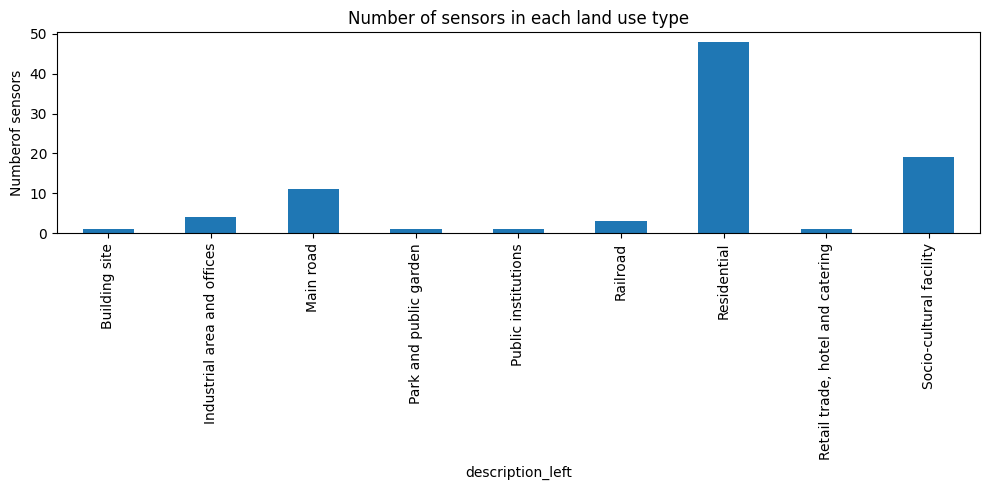

In [77]:
# Plot summary graph
lu_plot = joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)].groupby(['description_left']).size()
lu_plot.plot.bar(figsize=(10, 5))
# plt.xticks(rotation=30)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors in each land use type')
plt.tight_layout()
plt.savefig("chart/sm_pm25_lu.png")
plt.show()
plt.close()


Station distribution on each wijken (subarea)

In [78]:
# Station distribution on each wijken (subarea)
joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)].groupby(['wijknaam']).size()

wijknaam
Wijk 01 West                 8
Wijk 02 Noordwest            4
Wijk 03 Overvecht            2
Wijk 04 Noordoost           20
Wijk 05 Oost                20
Wijk 06 Binnenstad           7
Wijk 07 Zuid                11
Wijk 08 Zuidwest             8
Wijk 09 Leidsche Rijn        9
Wijk 10 Vleuten-De Meern     6
dtype: int64

**Sensor info (high to low)**
- Sensirion SPS030
    - https://sensirion.com/media/documents/8600FF88/616542B5/Sensirion_PM_Sensors_Datasheet_SPS30.pdf
- Plantower PMS7003
    - https://aqicn.org/air/sensor/spec/pms7003-english-v2.5.pdf
- Nova SDS011

More info https://www.samenmeten.nl/sensoren-voor-fijn-stof-pm25pm10, https://forum.mysensors.org/topic/6404/next-generation-dust-sensor-for-mysensors/13

In [79]:
# Find unique sensor for PM2.5 measurement
pm25_sensors = [j['Sensor']['name'] for i in joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(pm25_stations)]['Datastreams'] for j in i if j['ObservedProperty']['name'] == "pm25_kal"]
set(pm25_sensors)

{'Nova SDS011', 'Plantower PMS7003', 'Sensirion SPS030'}

In [80]:
pm25_station_df = pd.DataFrame(pm25_stations_order, columns=['name', 'lat', 'lon', 'wijknaam', 'owner category'])

Number of sensors based on Wijknaam (subarea) and owner category (PM 2.5)

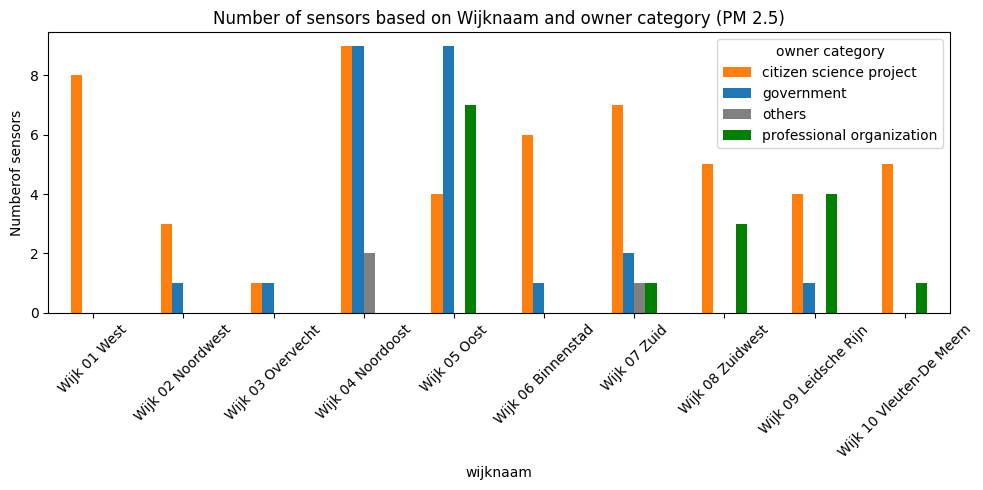

In [81]:
pm25_station_df['owner'] = pm25_owner
pm25_station_df['sensor'] = pm25_sensors
# pm25_station_df.groupby(['owner', 'sensor']).size()
# pm25_station_df.groupby(['wijknaam', 'owner']).size()
sum_plot = pm25_station_df.groupby(['wijknaam','owner category']).size().unstack(fill_value=0)

# Plot summary graph
sum_plot.plot.bar(figsize=(10, 5), color=['tab:orange', 'tab:blue', 'grey', 'green'])
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on Wijknaam and owner category (PM 2.5)')
plt.tight_layout()
plt.savefig("chart/sm_pm25_wijknaam_owner.png")
plt.show()
plt.close()

Number of sensors based on owner category and sensor (PM 2.5)

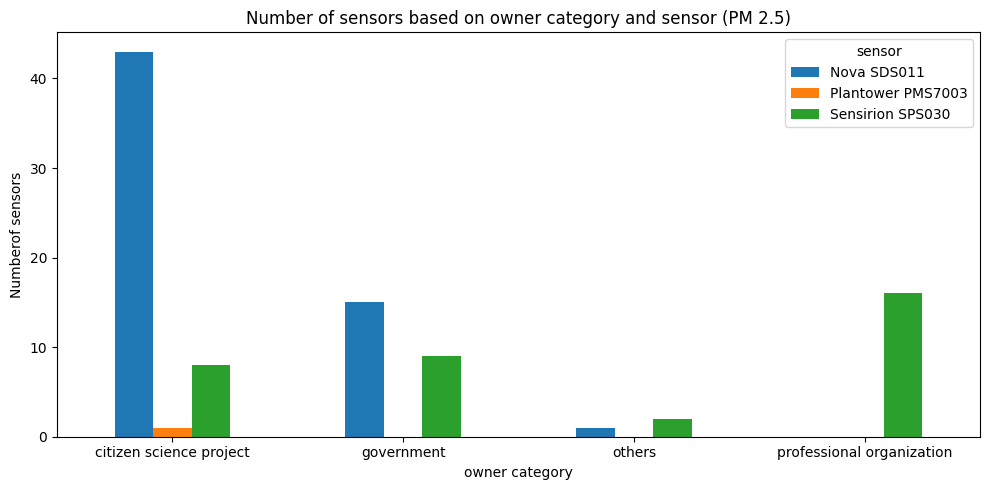

In [82]:
sum_plot2 = pm25_station_df.groupby(['owner category','sensor']).size().unstack(fill_value=0)
# plot summary graph
sum_plot2.plot.bar(figsize=(10, 5))
plt.xticks(rotation=0)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on owner category and sensor (PM 2.5)')
plt.tight_layout()
plt.savefig("chart/sm_pm25_owner_sensors.png")
plt.show()
plt.close()

##### NO2 data

In [83]:
# Check all owner for no2 stations
no2_owner = (airq_things_geodf[airq_things_geodf['name'].isin(no2_stations)]['properties.owner']).to_list()
print(set(no2_owner))

{'RIVM', 'Hollandse Luchten'}


In [84]:
# show NO2 stations location
no2_stations_order = []

map = folium.Map(location=[joined_airq_things_geodf['lat'].mean(), joined_airq_things_geodf['lon'].mean()], tiles="OpenStreetMap", zoom_start=14)

for index, location_info in joined_airq_things_geodf[(joined_airq_things_geodf['name'].isin(no2_stations))].iterrows():
    if location_info['properties.owner'] in gov_owner:
        color = "blue"
        ownerct_val = owner_cat[0]
    elif location_info['properties.owner'] in org_owner:
        color = "green"
        ownerct_val = owner_cat[1]
    elif location_info['properties.owner'] in citizen_owner:
        color = "orange"
        ownerct_val = owner_cat[2]
    else:
        color = "lightgray"
        ownerct_val = owner_cat[3]
    no2_stations_order.append([location_info['name'], location_info['new lat'], location_info['new lon'], location_info['wijknaam'], ownerct_val])

    folium.Marker([location_info['new lat'], location_info['new lon']], 
                  popup="<b>Thing name: </b>"
                  + location_info['name']
                  + "<br><b>Owner: </b>"
                  + location_info['properties.owner'],
                  icon=folium.Icon(color=color)).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea").add_to(map)
folium.GeoJsonTooltip(fields=['wijknaam']).add_to(wijken)
folium.LayerControl().add_to(map)

map

In [85]:
print("Number of Things related to NO2:", len(joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(no2_stations)]))

Number of Things related to NO2: 17


**Spatial distribution for NO2 stations**

Mostly clustered on the eastern side of Utrecht and all of them are owned by RIVM.
NO2 sensor calibration is more difficult than sensor for PM2.5 measurement

More info https://www.samenmeten.nl/sensoren-voor-no2

In [86]:
# Find unique sensor for NO2 measurement
no2_sensors = [j['Sensor']['name'] for i in joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(no2_stations)]['Datastreams'] for j in i if j['ObservedProperty']['name'] == "no2"]
set(no2_sensors)

{'Alphasense NO2'}

In [87]:
no2_station_df = pd.DataFrame(no2_stations_order, columns=['name', 'lat', 'lon', 'wijknaam', 'owner category'])

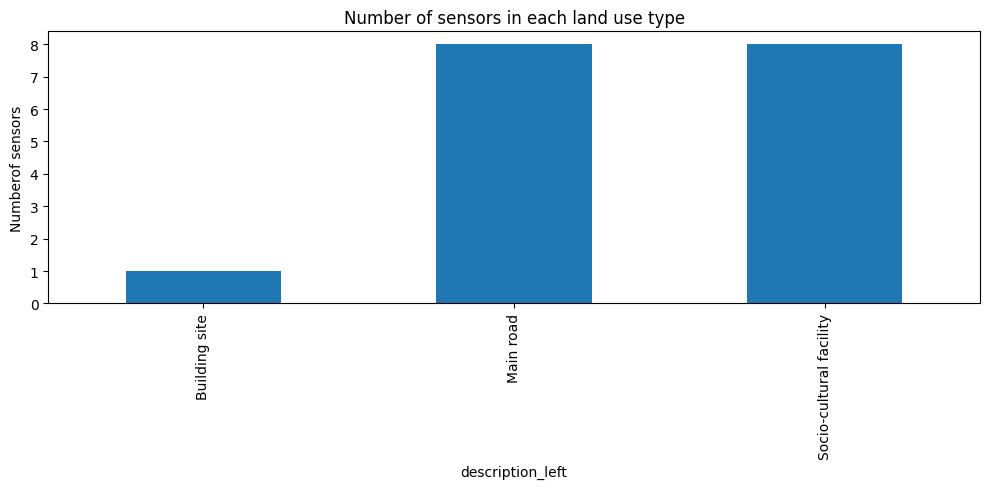

In [88]:
# Plot summary graph
lu_plot2 = joined_airq_things_geodf[joined_airq_things_geodf['name'].isin(no2_stations)].groupby(['description_left']).size()
lu_plot2.plot.bar(figsize=(10, 5))
# plt.xticks(rotation=30)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors in each land use type')
plt.tight_layout()
plt.savefig("chart/sm_no2_lu.png")
plt.show()
plt.close()


Number of sensors based on Wijknaam(subarea) and owner category (NO2)

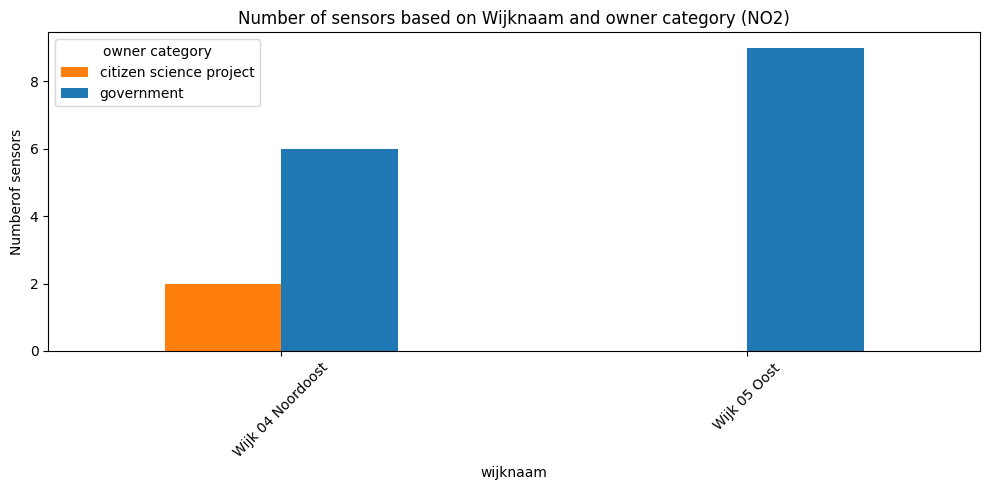

In [89]:
no2_station_df['owner'] = no2_owner
no2_station_df['sensor'] = no2_sensors
# no2_station_df.groupby(['owner', 'sensor']).size()
sum_no2_plot = no2_station_df.groupby(['wijknaam', 'owner category']).size().unstack(fill_value=0)

# Plot summary graph
sum_no2_plot.plot.bar(figsize=(10, 5), color=['tab:orange', 'tab:blue', 'grey', 'green'])
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on Wijknaam and owner category (NO2)')
plt.tight_layout()
plt.savefig("chart/sm_no2_wijknaam_owner.png")
plt.show()
plt.close()

#### Data from Luchtmeetnet

In [90]:
# Visualize the stations on map
map = folium.Map(location=[utrecht_station_metadata_geodf['lat'].mean(), utrecht_station_metadata_geodf['lon'].mean()], tiles="OpenStreetMap", zoom_start=14)

for index, location_info in utrecht_station_metadata_geodf.iterrows():
    folium.Marker([location_info['lat'], 
                   location_info['lon']], 
                   popup="<b>Station Name: </b>" 
                   + location_info['StationsNaam']).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea").add_to(map)
folium.GeoJsonTooltip(fields=['wijknaam']).add_to(wijken)
folium.LayerControl().add_to(map)

map

In [91]:
# There is one station that isn't in Utrecht municipality so I filtered it out
utrecht_station_metadata_geodf = utrecht_station_metadata_geodf[utrecht_station_metadata_geodf['StationsCode'] != "NL10641"]
utrecht_station_metadata_geodf

,StationsCode,BeheerderMeetStation,StationsNaam,"Latitude,Longitude",StationsGebied,StationsType,Meetprincipe,Meetopstelling,Accreditatienummer,lat,lon,geometry
34,NL10636,RIVM,Utrecht-Kardinaal de Jongweg,"(52.105031,5.124464)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.105031,5.124464,POINT (136999.478 457453.825)
35,NL10639,RIVM,Utrecht-Constant Erzeijstraat,"(52.067748,5.120507)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.067748,5.120507,POINT (136713.150 453306.760)
37,NL10643,RIVM,Utrecht-Griftpark,"(52.101308,5.128183)",stad,achtergrond,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.101308,5.128183,POINT (137252.792 457038.693)


**Station Type**
- verkeer = traffic
- achtergrond = background

**Stations Area (Gebied)**
- stad = city
- regionaal = region

In [92]:
utrecht_station_metadata_geodf

,StationsCode,BeheerderMeetStation,StationsNaam,"Latitude,Longitude",StationsGebied,StationsType,Meetprincipe,Meetopstelling,Accreditatienummer,lat,lon,geometry
34,NL10636,RIVM,Utrecht-Kardinaal de Jongweg,"(52.105031,5.124464)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.105031,5.124464,POINT (136999.478 457453.825)
35,NL10639,RIVM,Utrecht-Constant Erzeijstraat,"(52.067748,5.120507)",stad,verkeer,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.067748,5.120507,POINT (136713.150 453306.760)
37,NL10643,RIVM,Utrecht-Griftpark,"(52.101308,5.128183)",stad,achtergrond,Chemiluminescentie,Teledyne API T200 chemiluminescent NOx analyser,L224,52.101308,5.128183,POINT (137252.792 457038.693)


In [93]:
utrecht_station_metadata_geodf.groupby(['StationsGebied', 'StationsType']).size()

StationsGebied  StationsType
stad            achtergrond     1
                verkeer         2
dtype: int64

### Distribution of Data and Cleaning Data (PM 2.5 and NO2)

#### Data from Samenmeten

##### PM 2.5 Data

In [94]:
sm_pm25_df.describe()

,AMF_pm012,GLB_1745609,GLB_4182551,GLB_5939801,GLB_5965467,GLOBE_350916063264611,GLOBE_350916063264850,GLOBE_350916063265568,GLOBE_350916066550651,GLOBE_350916067031677,...,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510,UTR_bu006,UTR_bu007,UTR_bu011,UTR_bu020
count,7690.000000,31.000000,4892.000000,1318.000000,4787.000000,1212.000000,977.000000,974.000000,547.000000,1223.000000,...,5612.000000,7690.000000,6008.000000,2124.000000,5377.000000,5003.000000,1267.000000,1.000,7691.000000,1.0
mean,6.436696,1.556129,6.997872,11.679097,7.785454,11.615814,15.327226,16.342309,11.647130,12.851111,...,1.268017,7.697061,28.893045,10.098764,7.986107,13.531036,392.237230,7.018,0.140953,0.0
std,9.759871,1.112555,7.393096,13.345097,8.411499,10.253240,12.388472,12.742359,9.928257,11.496947,...,2.926576,13.229032,296.745305,12.562937,9.534868,14.814744,521.152097,NaN,0.076391,NaN
min,0.000000,0.330000,0.020000,0.290000,0.000000,0.748073,0.586250,0.778150,0.931045,0.658896,...,0.000000,0.000000,-1.048000,0.270000,0.312000,0.558000,1.222000,7.018,0.000000,0.0
25%,2.698000,0.850000,2.500000,4.132500,2.385705,3.773020,5.470000,5.827708,4.330575,4.030000,...,0.000000,0.112000,0.000000,2.992000,3.367000,5.437500,9.925500,7.018,0.092000,0.0
50%,4.416000,1.000000,4.620000,7.405000,4.920000,7.716420,11.460000,12.730000,9.102380,8.320000,...,0.139000,1.454000,0.000000,5.938000,5.334000,9.016000,109.710000,7.018,0.127000,0.0
75%,7.435500,2.075000,8.722500,15.462500,10.335000,17.050875,22.320000,23.447500,14.525000,18.550000,...,0.480000,10.654500,0.000000,10.977500,8.721000,15.468000,683.113000,7.018,0.184000,0.0
max,386.391000,4.190000,102.860000,294.330000,102.230000,49.700000,70.690000,107.520000,48.470000,54.320000,...,28.112000,178.416000,8965.470000,126.144000,131.064000,249.608000,3319.670000,7.018,0.831000,0.0


Histogram

Select one station (HLL_zps-09) that has both PM2.5 and NO2 measurements to visualize histogram

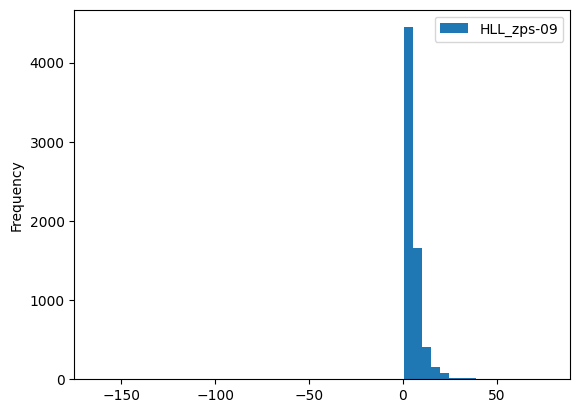

In [95]:
# Select one station that has both PM2.5 and NO2 measurements to visualize histogram
min_pm25_temp = sm_pm25_df['HLL_zps-09'].min()
max_pm25_temp = sm_pm25_df['HLL_zps-09'].max()
sm_pm25_df.plot.hist(column=['HLL_zps-09'], range=[min_pm25_temp, max_pm25_temp], bins=50)
plt.savefig("chart/sm_pm25_hist.png")
plt.show()
plt.close()

Boxplot

We clearly see the outliers

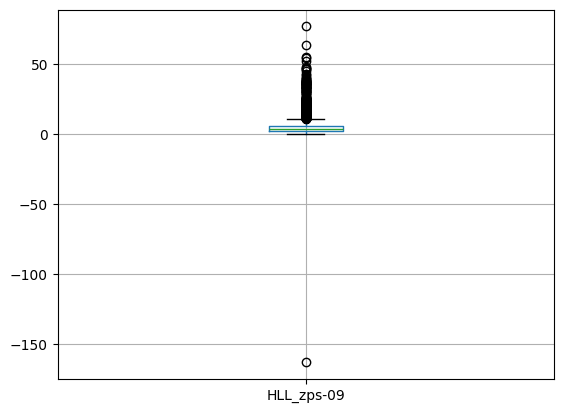

In [96]:
# Boxplot
sm_pm25_df.boxplot(column=['HLL_zps-09'])
plt.savefig("chart/sm_pm25_boxplot.png")
plt.show()
plt.close()

Detect Outlier for other columns

Using the below formula:
- lower bound = Q1 - 1.5 * IQR
- upper bound = Q3 + 1.5 * IQR

In [97]:
# Detect outliers
for col in sm_pm25_df.columns:
    if (col != "phenomenonTime") and (col != "phenomenonTime_datetime"):
        detect_outliers(sm_pm25_df, col)

AMF_pm012 has outliers!
GLB_1745609 has outliers!
GLB_4182551 has outliers!
GLB_5939801 has outliers!
GLB_5965467 has outliers!
GLOBE_350916063264611 has outliers!
GLOBE_350916063264850 has outliers!
GLOBE_350916063265568 has outliers!
GLOBE_350916066550651 has outliers!
GLOBE_350916067031677 has outliers!
HLL_zps-09 has outliers!
LTD_10414 has outliers!
LTD_11636 has outliers!
LTD_19824 has outliers!
LTD_25146 has outliers!
LTD_26302 has outliers!
LTD_31138 has outliers!
LTD_31898 has outliers!
LTD_34054 has outliers!
LTD_34530 has outliers!
LTD_34716 has outliers!
LTD_34722 has outliers!
LTD_35291 has outliers!
LTD_35706 has outliers!
LTD_41957 has outliers!
LTD_44936 has outliers!
LTD_46788 has outliers!
LTD_53212 has outliers!
LTD_53693 has outliers!
LTD_55142 has outliers!
LTD_55401 has outliers!
LTD_55645 has outliers!
LTD_57198 has outliers!
LTD_57243 has outliers!
LTD_57581 has outliers!
LTD_60640 has outliers!
LTD_62035 has outliers!
LTD_6361 has outliers!
LTD_66669 has outlie

Check skewness of data (not just data from one things location)

Conclusion:
- can conclude that most of PM 2.5 data has Right skewed (positive skewed)
- need to inspect the one that has normal distribution -> probably data is wrong
- inspect more why number not consistent with total -> The number isn't consistent with total PM 2.5 sensors because some sensors has only one data point

In [98]:
# Check skewness of data
pm25_skew = sm_pm25_df.skew(numeric_only=True)
print("Total PM2.5 Sensors across Utrecht:", len(pm25_sensors))
print("Left skewed:", len(pm25_skew[pm25_skew < 0]))
print("Normal distribution:", len(pm25_skew[pm25_skew == 0]))
print("Right skewed:", len(pm25_skew[pm25_skew > 0]))

Total PM2.5 Sensors across Utrecht: 95
Left skewed: 2
Normal distribution: 1
Right skewed: 88


In [ ]:
print("Total PM2.5 Sensors across Utrecht:", len(pm25_sensors))
print("Left skewed:", len(pm25_skew[pm25_skew < 0.5]))
print("Normal distribution:", len(pm25_skew[pm25_skew == 0]))
print("Right skewed:", len(pm25_skew[pm25_skew > 0.5]))

Remove outliers

In [99]:
# Check the one that has normal distribution
pm25_skew[pm25_skew == 0]
print("value in HLL_zps-10: ", sm_pm25_df['HLL_zps-10'].value_counts())
# Drop the HLL_zps-10
sm_pm25_df_copy = sm_pm25_df.drop(columns=['HLL_zps-10'])

value in HLL_zps-10:  0.0    5249
Name: HLL_zps-10, dtype: int64


In [100]:
# Check minus value
sm_pm25_min_sr = sm_pm25_df.min(numeric_only=True)
sm_pm25_min_sr[sm_pm25_min_sr < 0]

HLL_zps-09   -163.000
USP_pu502      -1.048
dtype: float64

In [101]:
# Replace minus value with np.nan
numeric_cols = sm_pm25_df_copy.select_dtypes(include=['number']).columns
sm_pm25_df_copy[numeric_cols] = sm_pm25_df_copy[numeric_cols].mask(sm_pm25_df_copy[numeric_cols] < 0, np.nan)

In [102]:
# Check value that exceed sensor measurement range
sm_pm25_max_sr = sm_pm25_df.max(numeric_only=True)
stations_temp = list(sm_pm25_max_sr[sm_pm25_max_sr > 1000].index)
sm_pm25_max_sr[sm_pm25_max_sr > 1000]

LTD_55142      4329.57
LTD_6874       2216.50
MJS_719       65447.00
MJS_721       65535.00
MJS_773       65533.00
MJS_782       65522.70
MJS_787       65535.00
MJS_791       65522.20
MJS_871       65516.20
MJS_883       65458.00
OZK_350928     1811.95
USP_pu502      8965.47
UTR_bu006      3319.67
dtype: float64

In [103]:
pm25_station_df[pm25_station_df['name'].isin(stations_temp)]

,name,lat,lon,wijknaam,owner category,owner,sensor
14,MJS_787,52.102,5.125,Wijk 04 Noordoost,citizen science project,Meetjestad,Sensirion SPS030
34,MJS_883,52.094,5.126,Wijk 06 Binnenstad,citizen science project,Meetjestad,Sensirion SPS030
36,MJS_791,52.092,5.118,Wijk 06 Binnenstad,citizen science project,Meetjestad,Sensirion SPS030
37,MJS_773,52.108,5.143,Wijk 04 Noordoost,citizen science project,Meetjestad,Sensirion SPS030
38,MJS_871,52.075,5.114,Wijk 08 Zuidwest,citizen science project,Meetjestad,Sensirion SPS030
39,MJS_782,52.109,5.124,Wijk 04 Noordoost,citizen science project,Meetjestad,Sensirion SPS030
40,MJS_721,52.096,5.120,Wijk 06 Binnenstad,citizen science project,Meetjestad,Sensirion SPS030
41,MJS_719,52.105,5.121,Wijk 04 Noordoost,citizen science project,Meetjestad,Sensirion SPS030
50,LTD_55142,52.075,5.129,Wijk 07 Zuid,citizen science project,Luftdaten,Nova SDS011
70,USP_pu502,52.105,5.124,Wijk 04 Noordoost,government,RIVM,Nova SDS011


Measurement range of Sensirion SPS030 and Nova SDS011 is **0-1000 microgram/m3**

In [104]:
# Replace >1000 value by np.nan
numeric_cols = sm_pm25_df_copy.select_dtypes(include=['number']).columns
sm_pm25_df_copy[numeric_cols] = sm_pm25_df_copy[numeric_cols].mask(sm_pm25_df_copy[numeric_cols] > 1000, np.nan)

In [105]:
sm_pm25_df_copy.describe()

,AMF_pm012,GLB_1745609,GLB_4182551,GLB_5939801,GLB_5965467,GLOBE_350916063264611,GLOBE_350916063264850,GLOBE_350916063265568,GLOBE_350916066550651,GLOBE_350916067031677,...,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510,UTR_bu006,UTR_bu007,UTR_bu011,UTR_bu020
count,7690.000000,31.000000,4892.000000,1318.000000,4787.000000,1212.000000,977.000000,974.000000,547.000000,1223.000000,...,5612.000000,7690.000000,5954.000000,2124.000000,5377.000000,5003.000000,1116.000000,1.000,7691.000000,1.0
mean,6.436696,1.556129,6.997872,11.679097,7.785454,11.615814,15.327226,16.342309,11.647130,12.851111,...,1.268017,7.697061,4.988413,10.098764,7.986107,13.531036,245.618289,7.018,0.140953,0.0
std,9.759871,1.112555,7.393096,13.345097,8.411499,10.253240,12.388472,12.742359,9.928257,11.496947,...,2.926576,13.229032,43.241317,12.562937,9.534868,14.814744,310.242568,NaN,0.076391,NaN
min,0.000000,0.330000,0.020000,0.290000,0.000000,0.748073,0.586250,0.778150,0.931045,0.658896,...,0.000000,0.000000,0.000000,0.270000,0.312000,0.558000,1.222000,7.018,0.000000,0.0
25%,2.698000,0.850000,2.500000,4.132500,2.385705,3.773020,5.470000,5.827708,4.330575,4.030000,...,0.000000,0.112000,0.000000,2.992000,3.367000,5.437500,9.060250,7.018,0.092000,0.0
50%,4.416000,1.000000,4.620000,7.405000,4.920000,7.716420,11.460000,12.730000,9.102380,8.320000,...,0.139000,1.454000,0.000000,5.938000,5.334000,9.016000,50.401000,7.018,0.127000,0.0
75%,7.435500,2.075000,8.722500,15.462500,10.335000,17.050875,22.320000,23.447500,14.525000,18.550000,...,0.480000,10.654500,0.000000,10.977500,8.721000,15.468000,456.931250,7.018,0.184000,0.0
max,386.391000,4.190000,102.860000,294.330000,102.230000,49.700000,70.690000,107.520000,48.470000,54.320000,...,28.112000,178.416000,914.904000,126.144000,131.064000,249.608000,999.900000,7.018,0.831000,0.0


Clean duplicated stations

In [106]:
drop_pm25_stations = get_dup_stations(pm25_station_df, sm_pm25_df_copy)
nodup_pm25_station_df = pm25_station_df[~(pm25_station_df['name'].isin(drop_pm25_stations))]
nodup_pm25_station_df.duplicated(subset=['lat', 'lon'], keep=False).value_counts()

False    79
dtype: int64

Remove stations (columns) that had less data points

In [107]:
# Remove column outliers
sm_pm25_annual_df, sm_pm25_month_df = remove_column_outliers("sm", sm_pm25_df_copy, drop_pm25_stations)

In [108]:
sm_pm25_annual_df.describe()

,AMF_pm012,GLB_4182551,GLB_5939801,GLB_5965467,GLOBE_350916063264611,GLOBE_350916063264850,GLOBE_350916063265568,GLOBE_350916066550651,GLOBE_350916067031677,HLL_zps-09,...,SSK_USP05,SSK_USP06,USP_pu002,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,UTR_bu006,UTR_bu011
count,7690.000000,4892.000000,1318.000000,4787.000000,1212.000000,977.000000,974.000000,547.000000,1223.000000,6826.000000,...,2797.000000,2817.000000,7631.000000,5612.000000,7690.000000,5954.000000,2124.000000,5377.000000,1116.000000,7691.000000
mean,6.436696,6.997872,11.679097,7.785454,11.615814,15.327226,16.342309,11.647130,12.851111,5.405828,...,11.666678,11.181530,8.160279,1.268017,7.697061,4.988413,10.098764,7.986107,245.618289,0.140953
std,9.759871,7.393096,13.345097,8.411499,10.253240,12.388472,12.742359,9.928257,11.496947,4.962736,...,11.853462,10.869251,8.912442,2.926576,13.229032,43.241317,12.562937,9.534868,310.242568,0.076391
min,0.000000,0.020000,0.290000,0.000000,0.748073,0.586250,0.778150,0.931045,0.658896,0.450000,...,0.411750,0.381346,0.318000,0.000000,0.000000,0.000000,0.270000,0.312000,1.222000,0.000000
25%,2.698000,2.500000,4.132500,2.385705,3.773020,5.470000,5.827708,4.330575,4.030000,2.730000,...,3.920000,3.880000,3.276000,0.000000,0.112000,0.000000,2.992000,3.367000,9.060250,0.092000
50%,4.416000,4.620000,7.405000,4.920000,7.716420,11.460000,12.730000,9.102380,8.320000,4.088000,...,7.360000,7.280000,5.516000,0.139000,1.454000,0.000000,5.938000,5.334000,50.401000,0.127000
75%,7.435500,8.722500,15.462500,10.335000,17.050875,22.320000,23.447500,14.525000,18.550000,6.181500,...,15.930000,15.260000,9.472000,0.480000,10.654500,0.000000,10.977500,8.721000,456.931250,0.184000
max,386.391000,102.860000,294.330000,102.230000,49.700000,70.690000,107.520000,48.470000,54.320000,77.172000,...,128.120000,115.270000,107.464000,28.112000,178.416000,914.904000,126.144000,131.064000,999.900000,0.831000


##### NO2 Data

In [109]:
sm_no2_df.describe()

,HLL_zps-09,HLL_zps-10,SSK_LH023,SSK_LH025,SSK_USP01,SSK_USP02,SSK_USP03,SSK_USP04,SSK_USP05,SSK_USP06,USP_pu002,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510
count,5140.000000,3674.000000,1.0000,1.0000,5216.000000,3920.000000,2741.000000,4385.000000,2816.000000,2841.000000,5925.000000,5651.0,5980.0,4287.000000,1448.000000,3634.000000,3265.000000
mean,-25.169489,9.100953,12.8542,11.9934,-925.084624,-902.052860,-858.401879,-911.020345,-862.175999,-863.276261,-53.626978,-999.0,-999.0,-35.027760,-154.691332,-121.921473,118.129518
std,219.600653,122.530947,NaN,NaN,262.977927,297.684795,349.468621,284.847702,345.446875,344.425816,372.062249,0.0,0.0,223.349661,376.480025,342.241601,177.303019
min,-999.000000,-999.000000,12.8542,11.9934,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.0,-999.0,-999.000000,-999.000000,-999.000000,-999.000000
25%,15.484625,15.756525,12.8542,11.9934,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,52.136800,-999.0,-999.0,9.281040,8.979960,5.901957,34.641200
50%,24.222300,25.742400,12.8542,11.9934,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,86.294700,-999.0,-999.0,15.800100,11.759200,10.169950,115.316000
75%,31.560225,31.584400,12.8542,11.9934,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,107.629000,-999.0,-999.0,21.445750,14.646725,14.502925,209.602000
max,131.392000,99.409300,12.8542,11.9934,53.317100,47.161900,45.997600,47.928100,42.209500,46.289000,299.743000,-999.0,-999.0,242.415000,28.764100,33.228600,474.262000


In [110]:
# Replace -999 value with NaN value
sm_no2_df_copy = sm_no2_df.replace(-999, np.nan)

In [111]:
sm_no2_df_copy.describe()

,HLL_zps-09,HLL_zps-10,SSK_LH023,SSK_LH025,SSK_USP01,SSK_USP02,SSK_USP03,SSK_USP04,SSK_USP05,SSK_USP06,USP_pu002,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510
count,4892.000000,3621.000000,1.0000,1.0000,382.000000,376.000000,382.000000,382.000000,382.000000,382.000000,5136.000000,0.0,0.0,4069.000000,1208.000000,3154.000000,3215.000000
mean,24.198860,23.856366,12.8542,11.9934,10.273830,11.725502,9.846727,10.923521,9.629285,10.400895,91.602639,NaN,NaN,16.617841,13.052112,11.559089,135.503227
std,12.071403,11.696636,NaN,NaN,9.619776,7.535475,8.327182,9.233059,7.334974,8.034114,35.800597,NaN,NaN,9.657861,3.806897,5.275496,110.493221
min,0.021895,0.000087,12.8542,11.9934,0.036540,2.840480,0.569783,0.956267,2.444910,2.274430,2.500000,NaN,NaN,0.057068,0.910508,0.055678,0.086957
25%,17.209450,16.324900,12.8542,11.9934,3.880460,7.075720,4.413350,4.829038,5.039917,5.226478,67.931000,NaN,NaN,10.318000,10.752700,7.237382,37.964000
50%,24.998450,25.923400,12.8542,11.9934,5.965690,8.474205,6.033870,6.597880,5.948790,6.450955,92.183450,NaN,NaN,16.272600,12.431000,11.231950,117.593000
75%,31.888225,31.679300,12.8542,11.9934,14.783450,14.930625,14.493500,15.814300,13.703900,14.703450,110.778250,NaN,NaN,21.757600,15.216350,15.143875,211.844000
max,131.392000,99.409300,12.8542,11.9934,53.317100,47.161900,45.997600,47.928100,42.209500,46.289000,299.743000,NaN,NaN,242.415000,28.764100,33.228600,474.262000


Histogram

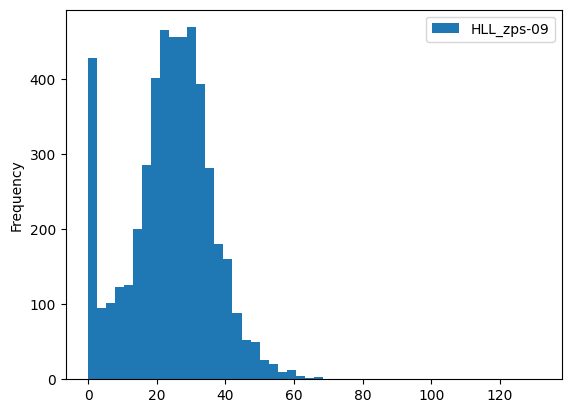

In [112]:
min_no2_temp = sm_no2_df_copy['HLL_zps-09'].min()
max_no2_temp = sm_no2_df_copy['HLL_zps-09'].max()
sm_no2_df_copy.plot.hist(column=['HLL_zps-09'], range=[min_no2_temp, max_no2_temp], bins=50)
plt.savefig("chart/sm_no2_hist.png")
plt.show()
plt.close()

Boxplot

We clearly see the outliers

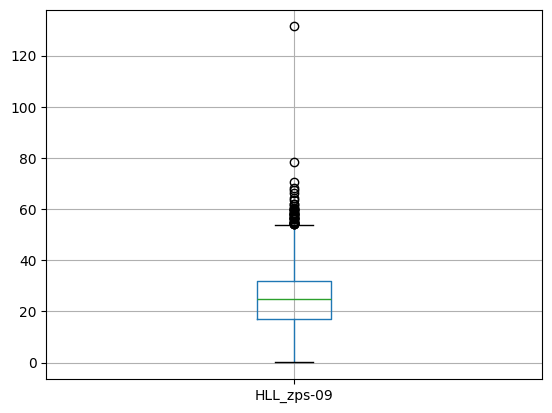

In [113]:
# Boxplot
sm_no2_df_copy.boxplot(column=['HLL_zps-09'])
plt.savefig("chart/sm_no2_boxplot.png")
plt.show()
plt.close()

Detect Outlier for other columns

Using the below formula:
- lower bound = Q1 - 1.5 * IQR
- upper bound = Q3 + 1.5 * IQR

In [114]:
sm_no2_df_copy

,phenomenonTime_datetime,phenomenonTime,HLL_zps-09,HLL_zps-10,SSK_LH023,SSK_LH025,SSK_USP01,SSK_USP02,SSK_USP03,SSK_USP04,SSK_USP05,SSK_USP06,USP_pu002,USP_pu009,USP_pu016,USP_pu502,USP_pu504,USP_pu508,USP_pu510
0,2023-01-01 00:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-01 01:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2023-01-01 02:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-01-01 03:00:00+01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023-01-01 04:00:00+01:00,2023-01-01T03:00:00.000Z,8.49928,8.30989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2023-12-31 19:00:00+01:00,2023-12-31T18:00:00.000Z,NaN,NaN,NaN,NaN,3.91151,5.89620,4.31489,4.14254,4.74573,4.99850,103.454,NaN,NaN,NaN,10.6401,NaN,NaN
8756,2023-12-31 20:00:00+01:00,2023-12-31T19:00:00.000Z,NaN,NaN,NaN,NaN,4.40194,6.44241,4.85498,4.76416,5.15241,5.34660,102.407,NaN,NaN,NaN,11.1311,NaN,NaN
8757,2023-12-31 21:00:00+01:00,2023-12-31T20:00:00.000Z,NaN,NaN,NaN,NaN,4.78779,6.66974,5.17690,5.36123,5.43375,5.74037,101.540,NaN,NaN,NaN,11.4114,NaN,NaN
8758,2023-12-31 22:00:00+01:00,2023-12-31T21:00:00.000Z,NaN,NaN,NaN,NaN,4.39950,6.46841,5.04240,4.98179,5.11315,5.51216,102.688,NaN,NaN,NaN,11.1493,NaN,NaN


In [115]:
# Detect outliers
for col in sm_no2_df_copy.columns:
    if (col != "phenomenonTime") and (col != "phenomenonTime_datetime"):
        detect_outliers(sm_no2_df_copy, col)

HLL_zps-09 has outliers!
HLL_zps-10 has outliers!
SSK_USP01 has outliers!
SSK_USP02 has outliers!
SSK_USP03 has outliers!
SSK_USP04 has outliers!
SSK_USP05 has outliers!
SSK_USP06 has outliers!
USP_pu002 has outliers!
USP_pu502 has outliers!
USP_pu504 has outliers!
USP_pu508 has outliers!
USP_pu510 has outliers!


C:\Users\japan\AppData\Roaming\Python\Python39\site-packages\numpy\lib\nanfunctions.py:1545: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


Check skewness of data (not just data from one things location)

Conclusion:
- can conclude that all of NO2 data has Right skewed (positive skewed)
- inspect more why number not consistent with total -> The number isn't consistent with total PM 2.5 sensors because some sensors has only one data point

In [116]:
# Check skewness of data
no2_skew = sm_no2_df_copy.skew(numeric_only=True)
print("Total NO2 Sensors across Utrecht:", len(no2_sensors))
print("Left skewed:", len(no2_skew[no2_skew < 0]))
print("Normal distribution:", len(no2_skew[no2_skew == 0]))
print("Right skewed:", len(no2_skew[no2_skew > 0]))

Total NO2 Sensors across Utrecht: 17
Left skewed: 0
Normal distribution: 0
Right skewed: 13


Clean duplicated stations

In [117]:
drop_no2_stations = get_dup_stations(no2_station_df, sm_no2_df_copy)
nodup_no2_station_df = no2_station_df[~(no2_station_df['name'].isin(drop_no2_stations))]
nodup_no2_station_df.duplicated(subset=['lat', 'lon'], keep=False).value_counts()

False    13
dtype: int64

Remove stations (columns) that had less data points

In [118]:
# Remove column that is outliers
sm_no2_annual_df, sm_no2_month_df = remove_column_outliers("sm", sm_no2_df_copy, drop_no2_stations)

In [119]:
sm_no2_annual_df.describe()

,HLL_zps-09,HLL_zps-10,USP_pu002,USP_pu502,USP_pu504,USP_pu508
count,4892.000000,3621.000000,5136.000000,4069.000000,1208.000000,3154.000000
mean,24.198860,23.856366,91.602639,16.617841,13.052112,11.559089
std,12.071403,11.696636,35.800597,9.657861,3.806897,5.275496
min,0.021895,0.000087,2.500000,0.057068,0.910508,0.055678
25%,17.209450,16.324900,67.931000,10.318000,10.752700,7.237382
50%,24.998450,25.923400,92.183450,16.272600,12.431000,11.231950
75%,31.888225,31.679300,110.778250,21.757600,15.216350,15.143875
max,131.392000,99.409300,299.743000,242.415000,28.764100,33.228600


##### Relationship between PM2.5 and NO2
Station that I used to show their correlation: HLL_zps-09 

In [120]:
sm_pm25_temp = sm_pm25_annual_df.dropna(subset=['HLL_zps-09'])
sm_no2_temp = sm_no2_annual_df.dropna(subset=['HLL_zps-09'])

sm_coor_temp = pd.merge(sm_pm25_temp, sm_no2_temp, on="phenomenonTime_datetime", how="inner")

In [121]:
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(sm_coor_temp['HLL_zps-09_x'], sm_coor_temp['HLL_zps-09_y'])
# Pearson's Correlation
print('Pearsons correlation between PM2.5 and NO2: %.3f' % r_value)

Pearsons correlation between PM2.5 and NO2: 0.021


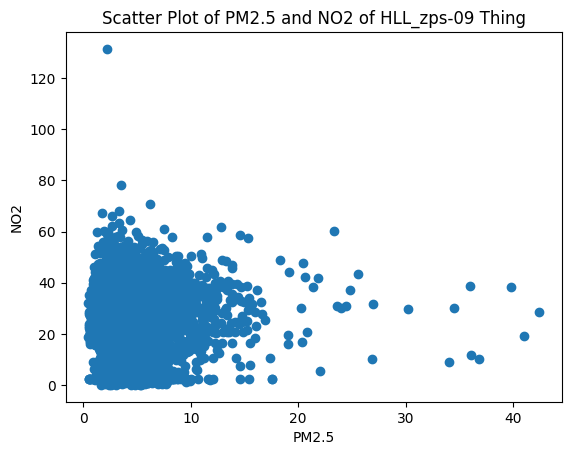

In [122]:
plt.scatter(sm_coor_temp['HLL_zps-09_x'], sm_coor_temp['HLL_zps-09_y'])
plt.xlabel('PM2.5')
plt.ylabel('NO2')
plt.title('Scatter Plot of PM2.5 and NO2 of HLL_zps-09 Thing')
# plt.plot(sm_coor_temp['HLL_zps-09_x'], slope*sm_coor_temp['HLL_zps-09_y']+intercept, color='orange')
plt.savefig("chart/sm_pm25_no2_corr.png")
plt.show()
plt.close()

#### Data from Luchtmeetnet

##### PM 2.5 Data

In [123]:
lm_pm25_df.describe()

,NL10636,NL10643
count,8462.000000,8439.000000
mean,8.429235,7.506884
std,7.425998,7.049362
min,-4.805000,-4.997000
25%,3.784500,3.020500
50%,6.830000,5.930000
75%,11.032000,10.170000
max,171.576000,144.332000


> Note <br>
> Minus value should be kept in this dataset regarding to Luchtmeetnet <br>
> Reference: https://www.luchtmeetnet.nl/informatie/overige/negatieve-waarden

Histogram

Select one station (NL10636) that has both PM2.5 and NO2 measurements to visualize histogram

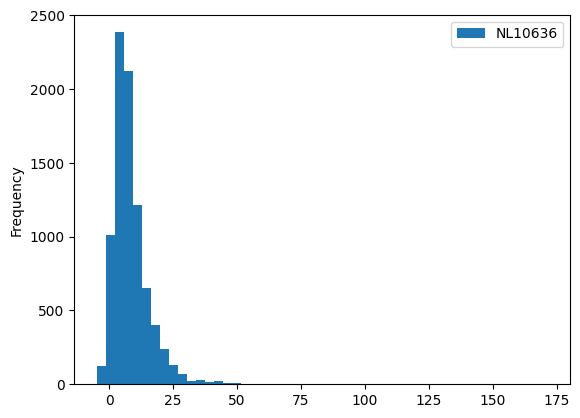

In [124]:
min_pm25_temp = lm_pm25_df['NL10636'].min()
max_pm25_temp = lm_pm25_df['NL10636'].max()
lm_pm25_df.plot.hist(column=['NL10636'], range=[min_pm25_temp, max_pm25_temp], bins=50)
plt.savefig("chart/lm_pm25_hist.png")
plt.show()
plt.close()

Boxplot

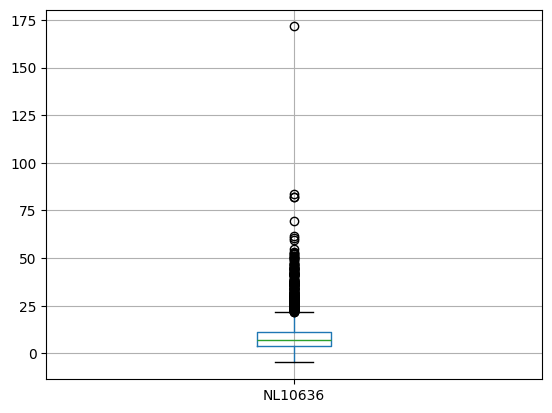

In [125]:
lm_pm25_df.boxplot(column=['NL10636'])
plt.savefig("chart/lm_pm25_boxplot.png")
plt.show()
plt.close()

Detect Outlier for other columns

Using the below formula:
- lower bound = Q1 - 1.5 * IQR
- upper bound = Q3 + 1.5 * IQR

In [126]:
# Detect outliers
for col in lm_pm25_df.columns:
    if "NL" in col:
        detect_outliers(lm_pm25_df, col)

NL10636 has outliers!
NL10643 has outliers!


Check skewness of data
- can conclude that all of PM2.5 data has Right skewed (positive skewed)

In [127]:
# Check skewness of data
lm_pm25_skew = lm_pm25_df.skew(numeric_only=True)
lm_pm25_stations = list(lm_pm25_df)
lm_pm25_stations = [station for station in lm_pm25_stations if "NL" in station]
print("Total PM2.5 official stations:", len(lm_pm25_stations))
print("Left skewed:", len(lm_pm25_skew[lm_pm25_skew < 0]))
print("Normal distribution:", len(lm_pm25_skew[lm_pm25_skew == 0]))
print("Right skewed:", len(lm_pm25_skew[lm_pm25_skew > 0]))

Total PM2.5 official stations: 2
Left skewed: 0
Normal distribution: 0
Right skewed: 2


##### NO2 Data

In [128]:
lm_no2_df.describe()

,NL10639,NL10636,NL10643
count,8700.000000,8694.000000,8712.000000
mean,17.833526,15.541892,12.769482
std,11.746368,10.975743,9.592871
min,1.360000,0.980000,1.090000
25%,9.410000,7.570000,6.110000
50%,14.440000,12.520000,9.860000
75%,23.082500,20.520000,16.382500
max,122.410000,81.890000,66.990000


Histogram

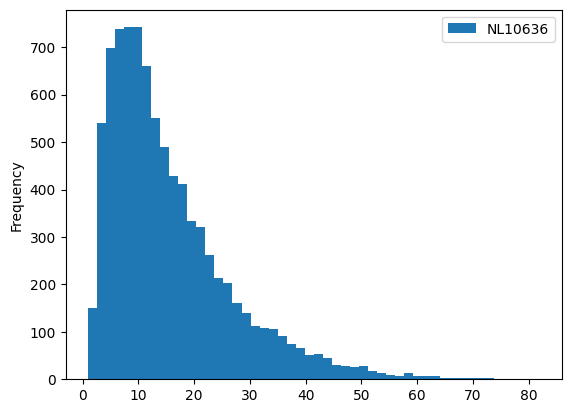

In [129]:
min_no2_temp = lm_no2_df['NL10636'].min()
max_no2_temp = lm_no2_df['NL10636'].max()
lm_no2_df.plot.hist(column=['NL10636'], range=[min_no2_temp, max_no2_temp], bins=50)
plt.savefig("chart/lm_no2_hist.png")
plt.show()
plt.close()

Boxplot

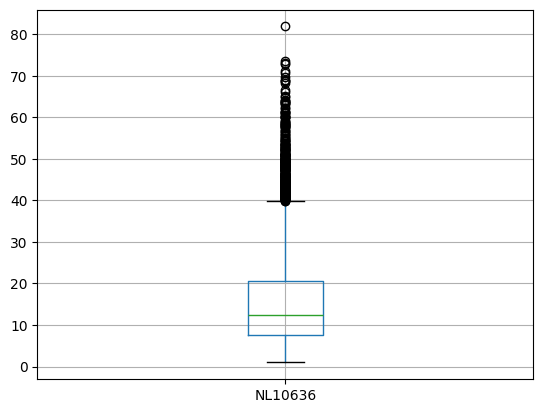

In [130]:
lm_no2_df.boxplot(column=['NL10636'])
plt.savefig("chart/lm_no2_boxplot.png")
plt.show()
plt.close()

Detect Outlier for other columns

Using the below formula:
- lower bound = Q1 - 1.5 * IQR
- upper bound = Q3 + 1.5 * IQR

In [131]:
# Detect outliers
for col in lm_no2_df.columns:
    if "NL" in col:
        detect_outliers(lm_no2_df, col)

NL10639 has outliers!
NL10636 has outliers!
NL10643 has outliers!


Check skewness of data
- can conclude that all of NO2 data has Right skewed (positive skewed)

In [132]:
# Check skewness of data
lm_no2_skew = lm_no2_df.skew(numeric_only=True)
lm_no2_stations = list(lm_no2_df)
lm_no2_stations = [station for station in lm_no2_stations if "NL" in station]
print("Total NO2 official stations:", len(lm_no2_stations))
print("Left skewed:", len(lm_no2_skew[lm_no2_skew < 0]))
print("Normal distribution:", len(lm_no2_skew[lm_no2_skew == 0]))
print("Right skewed:", len(lm_no2_skew[lm_no2_skew > 0]))

Total NO2 official stations: 3
Left skewed: 0
Normal distribution: 0
Right skewed: 3


##### Relationship between PM2.5 and NO2

Station that I used to show their correlation: NL10636

In [133]:
lm_pm25_temp = lm_pm25_df.dropna(subset=['NL10636'])
lm_no2_temp = lm_no2_df.dropna(subset=['NL10636'])

In [134]:
lm_coor_temp = pd.merge(lm_pm25_temp, lm_no2_temp, on="begin_datetime", how="inner")

In [135]:
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(lm_coor_temp['NL10636_x'], lm_coor_temp['NL10636_y'])
# Pearson's Correlation
print('Pearsons correlation between PM2.5 and NO2: %.3f' % r_value)

Pearsons correlation between PM2.5 and NO2: 0.379


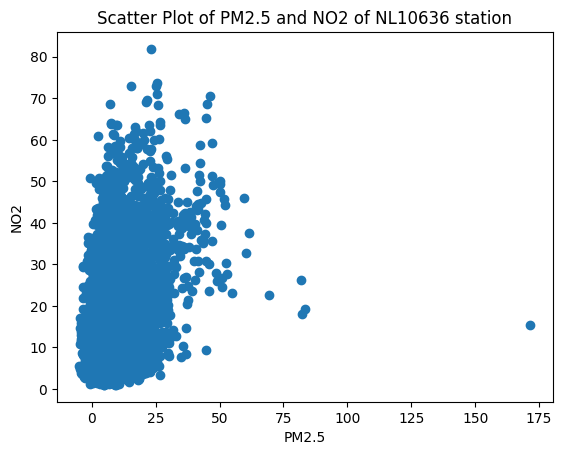

In [136]:
plt.scatter(lm_coor_temp['NL10636_x'], lm_coor_temp['NL10636_y'])
plt.xlabel('PM2.5')
plt.ylabel('NO2')
plt.title('Scatter Plot of PM2.5 and NO2 of NL10636 station')
# plt.plot(lm_coor_temp['NL10636_x'], lm_coor_temp['NL10636_y']+intercept, color='orange')
plt.savefig("chart/lm_pm25_no2_corr.png")
plt.show()
plt.close()

## Answer to three main questions

### How different is the air quality along bike paths during peak hours and off-peak hours?

**Peak hours and off-peak hours reference**

Peak hours: on weekdays from 6.30 am to 9 am and 4 pm to 6.30 pm. Everything outside these times is off-peak. 

Weekend: Friday evening 6.30 pm to Monday morning 4.00 am.

Weekend and Holiday are counted as off-peak hour.

Reference: NS website


#### PM 2.5

In [137]:
pm25_mean_peak_gdf, pm25_mean_offpeak_gdf = prepare_peak_offpeak_df(sm_pm25_month_df, lm_pm25_df, nodup_pm25_station_df, utrecht_station_metadata_geodf)

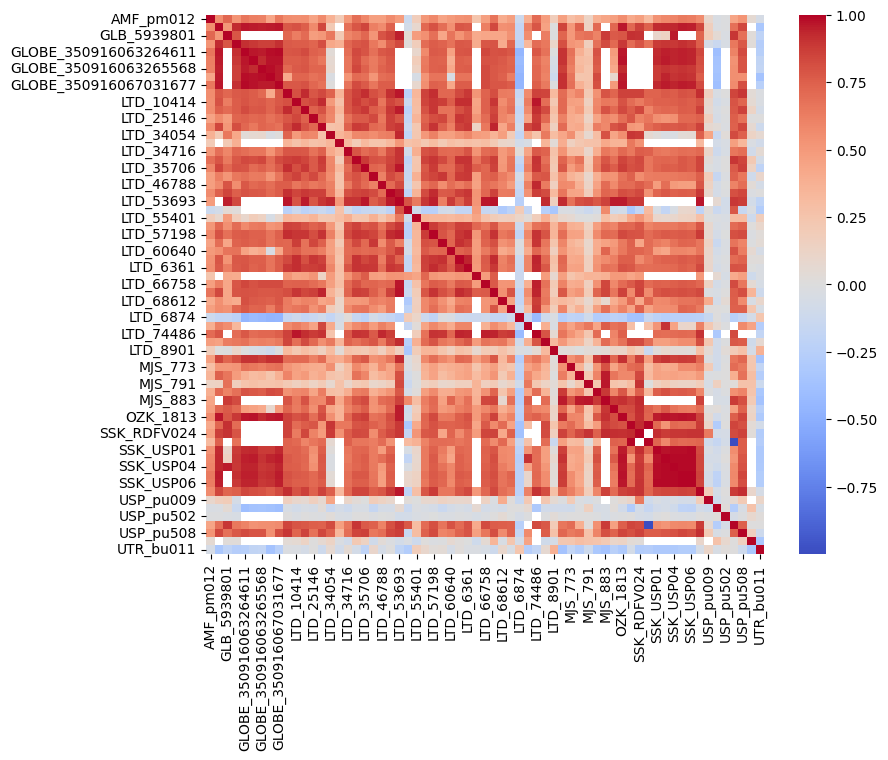

In [138]:
# Correlation matrix
correlation_matrix = sm_pm25_month_df.corr(numeric_only=True)
plt.figure(figsize=(9,7))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.savefig('chart/sm_pm25_heatmap_corr.png')
plt.show()
plt.close()

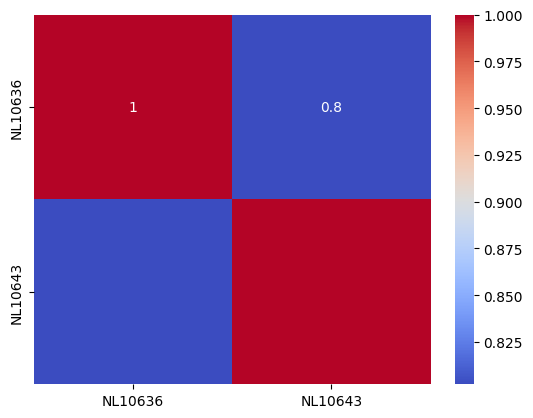

In [139]:
# Correlation matrix
correlation_matrix = lm_pm25_df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.savefig('chart/lm_pm25_heatmap_corr.png')
plt.show()
plt.close()

In [140]:
# check correlation between PM 2.5 value from Samenmeten and Luchtmeetnet
count_moderate_strong_corr = 0
total_corr = 0
for col1 in sm_pm25_month_df.columns:
    for col2 in lm_pm25_df:
        if (col1 != "phenomenonTime_datetime") and (col1 != "phenomenonTime") and ("NL" in col2):
            total_corr += 1
            correlation_coefficient = sm_pm25_annual_df[col1].corr(lm_pm25_df[col2])
            if (correlation_coefficient > 0.5) or (correlation_coefficient < -0.5):
                count_moderate_strong_corr += 1
            # print("Correlation Coefficient between", col1, "and", col2, ":", correlation_coefficient)
print("percent of moderate and strong correlation: %.2f" % ((count_moderate_strong_corr/total_corr)*100))

percent of moderate and strong correlation: 78.46


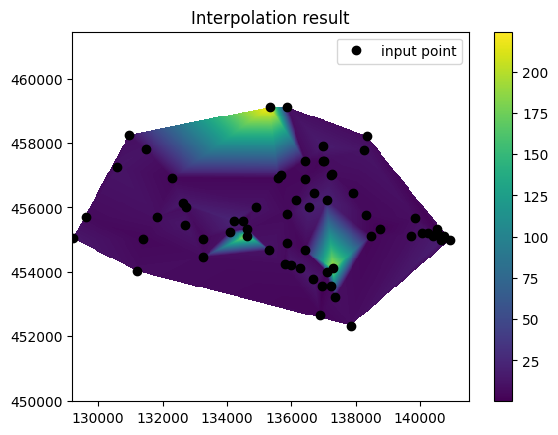

In [141]:
interpolate_value(pm25_mean_peak_gdf, "interpolation/pm25_peak_interpolation.tif")

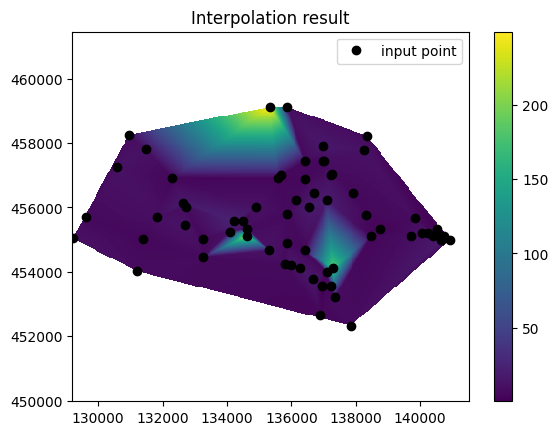

In [142]:
interpolate_value(pm25_mean_offpeak_gdf, "interpolation/pm25_offpeak_interpolation.tif")

In [143]:
prepare_refbound_raster("interpolation/pm25_peak_interpolation.tif", "interpolation/refbound_pm25_wgs84.tif")

c:\Users\japan\anaconda3\envs\gisenv\lib\site-packages\osgeo\gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [144]:
pm25_bikepath_peak = prepare_bikepath_raster_data("interpolation/pm25_peak_interpolation.tif", "interpolation/pm25_peak_interpolation_wgs84.tif")
pm25_bikepath_offpeak = prepare_bikepath_raster_data("interpolation/pm25_offpeak_interpolation.tif", "interpolation/pm25_offpeak_interpolation_wgs84.tif")

In [145]:
pm25_bikepath_peak[pm25_bikepath_peak == -9999] = np.nan
pm25_bikepath_offpeak[pm25_bikepath_offpeak == -9999] = np.nan

PM2.5 along bikepath in peak hour


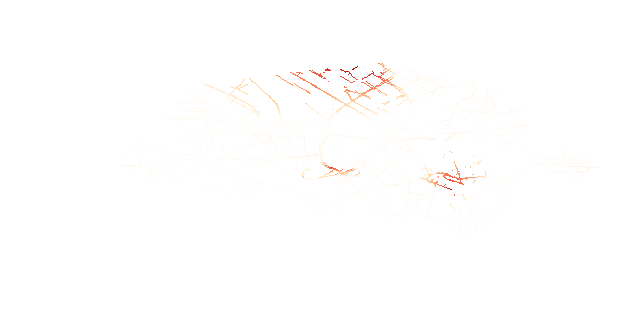

In [146]:
with rasterio.open("interpolation/refbound_pm25_wgs84.tif") as src:
    boundary = src.bounds

img = pm25_bikepath_peak

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=14, )
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="PM2.5 along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)
folium.LayerControl().add_to(map)
colormap.caption = "PM2.5 (µg/m³)"
map.add_child(colormap)

map.save("map/pm25_peak_hour.html")

map

PM2.5 along bikepath in off-peak hour


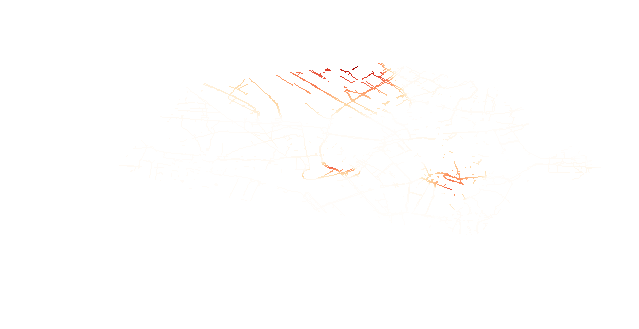

In [147]:
with rasterio.open("interpolation/refbound_pm25_wgs84.tif") as src:
    boundary = src.bounds

img = pm25_bikepath_offpeak

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=14)
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="PM2.5 along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

folium.LayerControl().add_to(map)
colormap.caption = "PM2.5 (µg/m³)"
map.add_child(colormap)

map.save("map/pm25_offpeak_hour.html")

map

Find PM2.5 difference between off-peak hour and peak hour

In [148]:
# Find PM2.5 difference between off-peak hour and peak hour
pm25_bikepath_diff = pm25_bikepath_offpeak - pm25_bikepath_peak
print(np.nanmin(pm25_bikepath_diff))
print(np.nanmax(pm25_bikepath_diff))

-13.021088
23.63356


PM2.5 difference between off-peak hour and peak hour


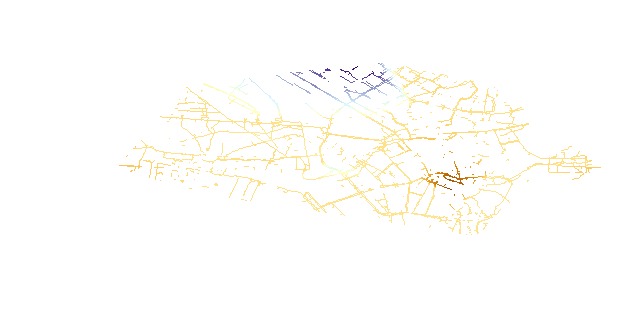

In [149]:
with rasterio.open("interpolation/refbound_pm25_wgs84.tif") as src:
    boundary = src.bounds

img = pm25_bikepath_diff

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.PuOr_10.scale(vmin, vmax)

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=14)
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="PM2.5 difference along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

folium.LayerControl().add_to(map)
colormap.caption = "PM2.5 difference between off-peak and peak hour"
map.add_child(colormap)
map.save("map/pm25_difference.html")

map

#### NO2

In [150]:
no2_mean_peak_gdf, no2_mean_offpeak_gdf = prepare_peak_offpeak_df(sm_no2_month_df, lm_no2_df, nodup_no2_station_df, utrecht_station_metadata_geodf)

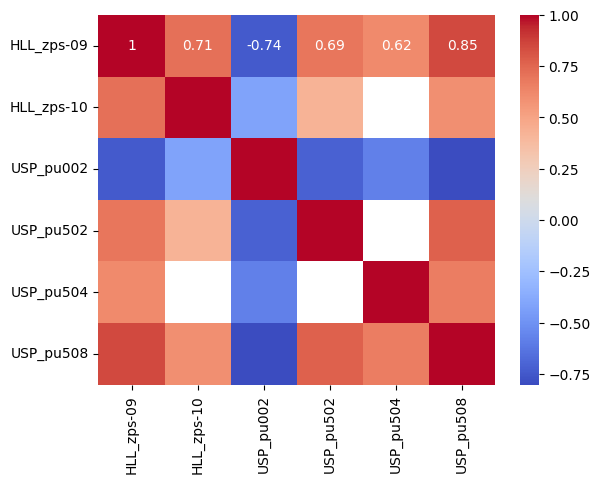

In [151]:
# Correlation matrix
correlation_matrix = sm_no2_annual_df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.savefig('chart/sm_no2_heatmap_corr.png')
plt.show()
plt.close()

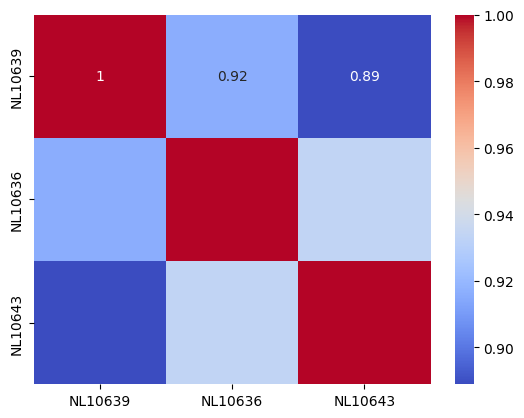

In [152]:
# Correlation matrix
correlation_matrix = lm_no2_df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.savefig('chart/lm_no2_heatmap_corr.png')
plt.show()
plt.close()

In [153]:
# check correlation between PM 2.5 value from Samenmeten and Luchtmeetnet
count_moderate_strong_corr = 0
total_corr = 0
for col1 in sm_no2_month_df.columns:
    for col2 in lm_no2_df:
        if (col1 != "phenomenonTime_datetime") and (col1 != "phenomenonTime") and ("NL" in col2):
            total_corr += 1
            correlation_coefficient = sm_no2_month_df[col1].corr(lm_no2_df[col2])
            if (correlation_coefficient > 0.5) or (correlation_coefficient < -0.5):
                count_moderate_strong_corr += 1
            # print("Correlation Coefficient between", col1, "and", col2, ":", correlation_coefficient)
print("percent of moderate and strong correlation: %.2f" % ((count_moderate_strong_corr/total_corr)*100))

percent of moderate and strong correlation: 50.00


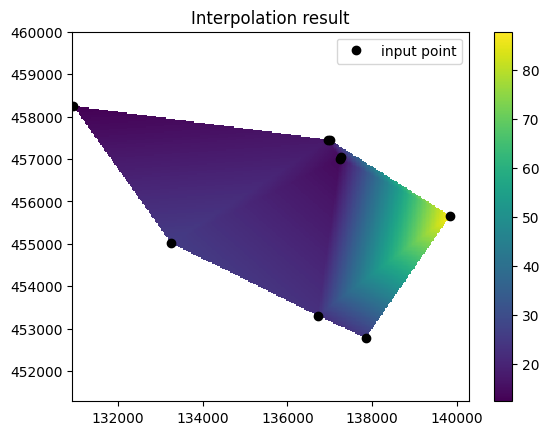

In [154]:
interpolate_value(no2_mean_peak_gdf, "interpolation/no2_peak_interpolation.tif")

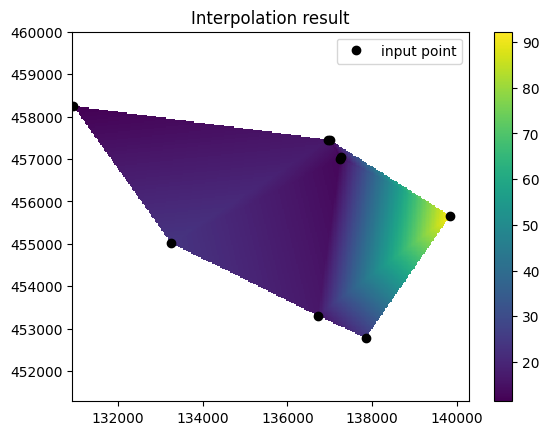

In [155]:
interpolate_value(no2_mean_offpeak_gdf, "interpolation/no2_offpeak_interpolation.tif")

In [156]:
prepare_refbound_raster("interpolation/no2_peak_interpolation.tif", "interpolation/refbound_no2_wgs84.tif")

In [157]:
no2_bikepath_peak = prepare_bikepath_raster_data("interpolation/no2_peak_interpolation.tif", "interpolation/no2_peak_interpolation_28992.tif")
no2_bikepath_offpeak = prepare_bikepath_raster_data("interpolation/no2_offpeak_interpolation.tif", "interpolation/no2_offpeak_interpolation_28992.tif")

In [158]:
no2_bikepath_peak[no2_bikepath_peak == -9999] = np.nan
no2_bikepath_offpeak[no2_bikepath_offpeak == -9999] = np.nan

NO2 along bikepath in peak hour


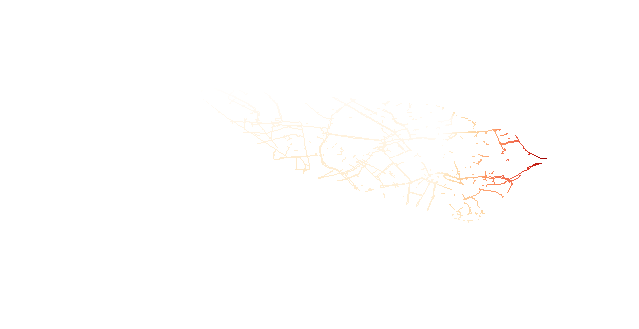

In [159]:
with rasterio.open("interpolation/refbound_no2_wgs84.tif") as src:
    boundary = src.bounds

img = no2_bikepath_peak

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=14)
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="NO2 along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

folium.LayerControl().add_to(map)
colormap.caption = "NO2 (µg/m³)"
map.add_child(colormap)
map.save("map/no2_peak_hour.html")

map

NO2 along bikepath in off-peak hour


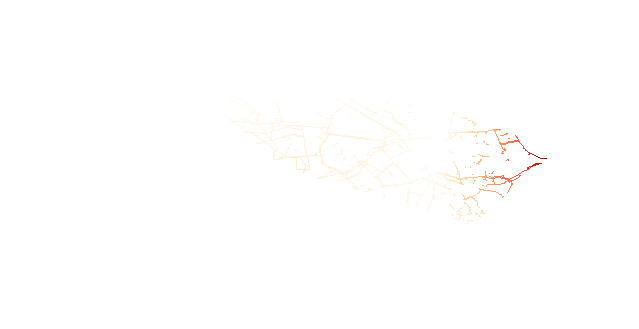

In [160]:
with rasterio.open("interpolation/refbound_no2_wgs84.tif") as src:
    boundary = src.bounds

img = no2_bikepath_offpeak

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=14)
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="NO2 along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

folium.LayerControl().add_to(map)
colormap.caption = "NO2 (µg/m³)"
map.add_child(colormap)
map.save("map/no2_offpeak_hour.html")

map

Find the NO2 difference between off-peak hour and peak hour

In [161]:
# Find the NO2 difference between off-peak hour and peak hour
no2_bikepath_diff = no2_bikepath_offpeak - no2_bikepath_peak
print(np.nanmin(no2_bikepath_diff))
print(np.nanmax(no2_bikepath_diff))

-6.481083
3.9529114



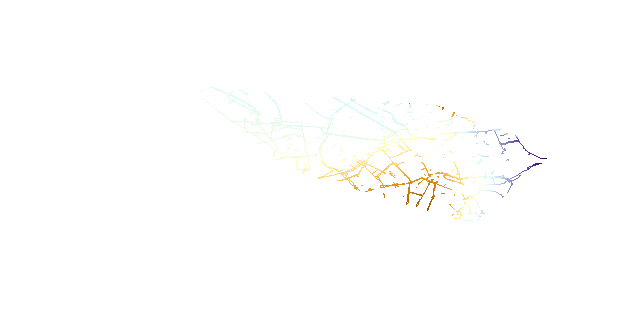

In [162]:
with rasterio.open("interpolation/refbound_no2_wgs84.tif") as src:
    boundary = src.bounds

img = no2_bikepath_diff

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.PuOr_10.scale(vmin, vmax)

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=14)
style = {'fillOpacity': 0}

folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img,
    name="NO2 difference along bikepath",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

folium.LayerControl().add_to(map)
colormap.caption = "NO2 difference between off-peak and peak hour"
map.add_child(colormap)
map.save("map/no2_difference.html")

map

### What are the neighborhoods of the city with the best and worst air quality along the year?

#### PM 2.5

In [163]:
all_pm25_mean_gdf = prepare_avg_annual_df(sm_pm25_annual_df, lm_pm25_df, nodup_pm25_station_df, utrecht_station_metadata_geodf)

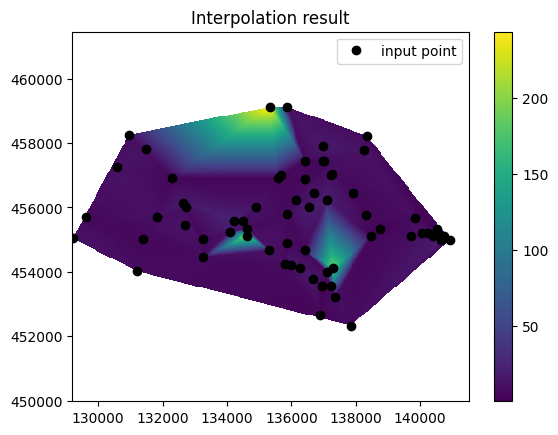

In [164]:
interpolate_value(all_pm25_mean_gdf, "interpolation/pm25_annual_interpolation.tif")

In [165]:
pm25_raster_ds = gdal.Warp("interpolation/pm25_annual_interpolation_wgs84.tif",
                           "interpolation/pm25_annual_interpolation.tif",
                           format="GTiff",
                           dstSRS="EPSG:4326",
                           cutlineDSName="data/utrecht_boundary.geojson",
                           dstNodata=-9999,
                           cropToCutline=True,
                           outputType=gdal.GDT_Float32)
pm25_raster_ds = None

PM2.5 Annual Average


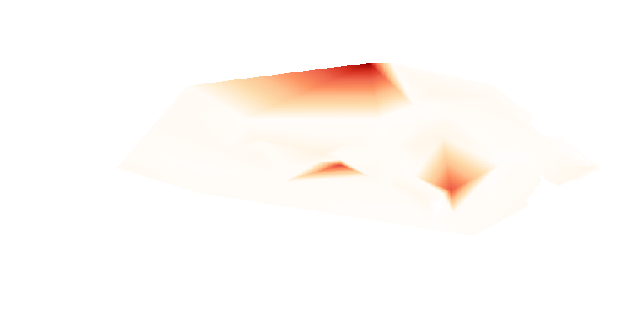

In [166]:
with rasterio.open("interpolation/pm25_annual_interpolation_wgs84.tif") as src:
    boundary = src.bounds
    img = src.read()

img[img == -9999] = np.nan

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="PM2.5 annual average",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value: map_value_with_color(value, colormap)
).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
colormap.caption = "PM2.5 (µg/m³)"
map.add_child(colormap)
map.save("map/pm25_annual_average.html")

map

In [167]:
np.nanmin(img)

0.22810094

PM2.5 - Categorized the value to 1-5 (followed the LKI index treshold)

In [168]:
# Assign the float value to make the visualization on the map make sense
pm25_annual_arr = img.copy()
pm25_annual_arr[(pm25_annual_arr >= 0) & (pm25_annual_arr < 20)] = 1
pm25_annual_arr[(pm25_annual_arr >= 20) & (pm25_annual_arr < 50)] = 2.1
pm25_annual_arr[(pm25_annual_arr >= 50) & (pm25_annual_arr < 90)] = 3.1
pm25_annual_arr[(pm25_annual_arr >= 90) & (pm25_annual_arr < 140)] = 4.1
pm25_annual_arr[pm25_annual_arr >= 140] = 5.1

In [169]:
# Assign the float value to make the visualization on the map make sense
# Used for inspecting more on good air quality area
pm25_annual_arr2 = img.copy()
pm25_annual_arr2[(pm25_annual_arr2 >= 0) & (pm25_annual_arr2 < 10)] = 1
pm25_annual_arr2[(pm25_annual_arr2 >= 10) & (pm25_annual_arr2 < 15)] = 2.1
pm25_annual_arr2[(pm25_annual_arr2 >= 15) & (pm25_annual_arr2 < 20)] = 3.1
pm25_annual_arr2[(pm25_annual_arr2 >= 20) & (pm25_annual_arr2 < 50)] = 4.1
pm25_annual_arr2[(pm25_annual_arr2 >= 50) & (pm25_annual_arr2 < 90)] = 5.1
pm25_annual_arr2[(pm25_annual_arr2 >= 90) & (pm25_annual_arr2 < 140)] = 6.1
pm25_annual_arr2[pm25_annual_arr2 >= 140] = 7.1


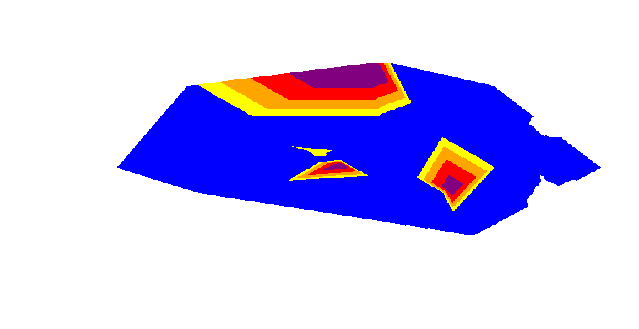

In [170]:
img = pm25_annual_arr

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.StepColormap(['blue', 'yellow', 'orange', 'red', 'purple'],
                           vmin=vmin, 
                           vmax=vmax,
                           index=[1,2,3,4,5])

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="Air quality categorized by using PM2.5 measurement",
    opacity=0.7,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value:map_value_with_color(value, colormap)
).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
colormap.caption = "Air quality level"
map.add_child(colormap)

map

Inspect more on **Good** air quality area to find the best air quality area


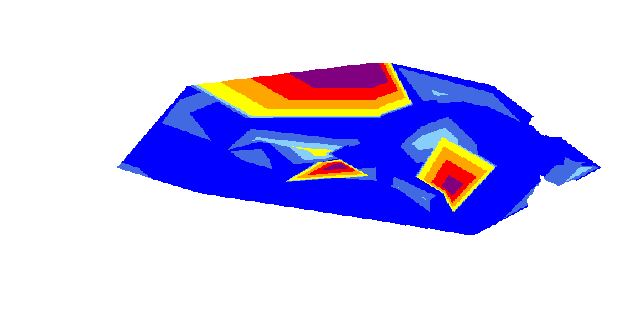

In [171]:
img = pm25_annual_arr2

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.StepColormap(['blue', 'royalblue', 'lightskyblue', 'yellow', 'orange', 'red', 'purple'],
                           vmin=vmin, 
                           vmax=vmax,
                           index=[1, 2, 3, 4, 5, 6, 7])

map = folium.Map(location=[nodup_pm25_station_df['lat'].mean(), nodup_pm25_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="Air quality categorized by using PM2.5 measurement",
    opacity=0.7,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value:map_value_with_color(value, colormap)
).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
colormap.caption = "Air quality level"
map.add_child(colormap)
map.save("map/pm25_categorized_airqual.html")

map

#### NO2

In [172]:
all_no2_mean_gdf = prepare_avg_annual_df(sm_no2_annual_df, lm_no2_df, nodup_no2_station_df, utrecht_station_metadata_geodf)

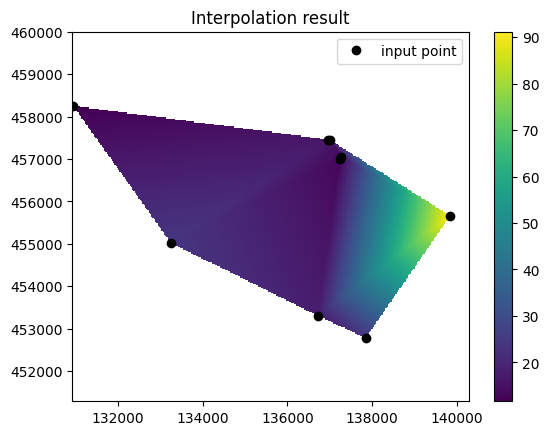

In [173]:
interpolate_value(all_no2_mean_gdf, "interpolation/no2_annual_interpolation.tif")

In [174]:
no2_raster_ds = gdal.Warp("interpolation/no2_annual_interpolation_wgs84.tif",
                          "interpolation/no2_annual_interpolation.tif",
                          format="GTiff",
                          dstSRS="EPSG:4326",
                          cutlineDSName="data/utrecht_boundary.geojson",
                          dstNodata=-9999,
                          cropToCutline=True,
                          outputType=gdal.GDT_Float32)
no2_raster_ds = None

NO2 Annual Average


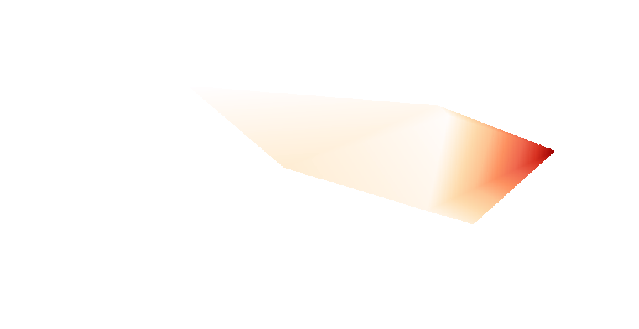

In [175]:
with rasterio.open("interpolation/no2_annual_interpolation_wgs84.tif") as src:
    boundary = src.bounds
    img = src.read()

img[img == -9999] = np.nan

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.linear.OrRd_08.scale(vmin, vmax)

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="NO2 annual average",
    opacity=1,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda x: map_value_with_color(x, colormap)
).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
colormap.caption = "NO2 (µg/m³)"
map.add_child(colormap)
map.save("map/no2_annual_average.html")

map

NO2 - Categorized the value to 1-5 (followed the LKI index treshold)

In [176]:
# Assign the float value to make the visualization on the map make sense
no2_annual_arr = img.copy()
no2_annual_arr[(no2_annual_arr >= 0) & (no2_annual_arr < 30)] = 1
no2_annual_arr[(no2_annual_arr >= 30) & (no2_annual_arr < 75)] = 2.1
no2_annual_arr[(no2_annual_arr >= 75) & (no2_annual_arr < 125)] = 3.1
no2_annual_arr[(no2_annual_arr >= 125) & (no2_annual_arr < 200)] = 4.1
no2_annual_arr[no2_annual_arr >= 200] = 5.1

In [177]:
# Assign the float value to make the visualization on the map make sense
# Used for inspecting more on good air quality area
no2_annual_arr2 = img.copy()
no2_annual_arr2[(no2_annual_arr2 >= 0) & (no2_annual_arr2 < 10)] = 1
no2_annual_arr2[(no2_annual_arr2 >= 10) & (no2_annual_arr2 < 20)] = 2.1
no2_annual_arr2[(no2_annual_arr2 >= 20) & (no2_annual_arr2 < 30)] = 3.1
no2_annual_arr2[(no2_annual_arr2 >= 30) & (no2_annual_arr2 < 75)] = 4.1
no2_annual_arr2[(no2_annual_arr2 >= 75) & (no2_annual_arr2 < 125)] = 5.1
no2_annual_arr2[(no2_annual_arr2 >= 125) & (no2_annual_arr2 < 200)] = 6.1
no2_annual_arr2[no2_annual_arr2 >= 200] = 7.1


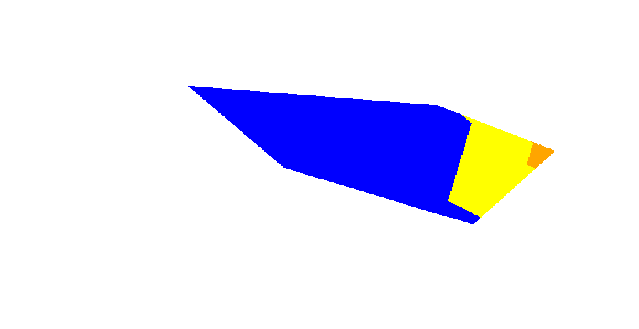

In [178]:
img = no2_annual_arr

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.StepColormap(['blue', 'yellow', 'orange', 'red', 'purple'],
                           vmin=vmin, 
                           vmax=vmax,
                           index=[1, 2, 3, 4, 5])

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="Air quality categorized by using NO2 measurement",
    opacity=0.7,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value:map_value_with_color(value, colormap)
).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
colormap.caption = "Air quality level"
map.add_child(colormap)

map

Inspect more on **Good** air quality area to find the best air quality area


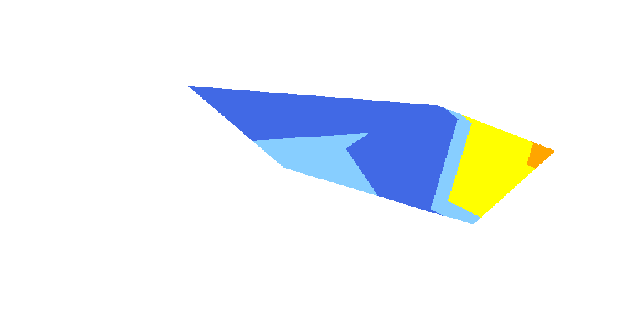

In [179]:
img = no2_annual_arr2

vmin = np.floor(np.nanmin(img))
vmax = np.ceil(np.nanmax(img))

colormap = cm.StepColormap(['blue', 'royalblue', 'lightskyblue', 'yellow', 'orange', 'red', 'purple'],
                           vmin=vmin, 
                           vmax=vmax,
                           index=[1, 2, 3, 4, 5, 7])

map = folium.Map(location=[nodup_no2_station_df['lat'].mean(), nodup_no2_station_df['lon'].mean()], zoom_start=12)
style = {'fillOpacity': 0}

# folium.GeoJson(utrecht_boundary, style_function=lambda x: style, name="Utrecht boundary").add_to(map)
folium.raster_layers.ImageOverlay(
    image=img[0],
    name="Air quality categorized by using NO2 measurement",
    opacity=0.7,
    bounds= [[boundary.bottom, boundary.left], [boundary.top, boundary.right]],
    colormap= lambda value:map_value_with_color(value, colormap)
).add_to(map)

colormap.caption = "Air quality level"
map.add_child(colormap)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea", style_function=lambda x: style).add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
map.save("map/no2_categorized_airqual.html")

map

### Which areas of the city have the most and least reliable air pollution data?

#### PM 2.5 

In [180]:
lm_station_df = utrecht_wijken_boundary.sjoin(utrecht_station_metadata_geodf, how="right")

In [181]:
# Rename column name and add addional data
lm_station_df = lm_station_df[['StationsCode', 'lat', 'lon', 'wijknaam', 'BeheerderMeetStation']]
lm_station_df = lm_station_df.rename(columns={'StationsCode': 'name', 'BeheerderMeetStation': 'owner'})
lm_station_df['owner category'] = "government"

In [182]:
all_pm25_stations_df = nodup_pm25_station_df.copy()
all_pm25_stations_df = pd.concat([nodup_pm25_station_df, lm_station_df])

In [183]:
all_pm25_stations_df = all_pm25_stations_df[all_pm25_stations_df['name'] != "NL10639"]

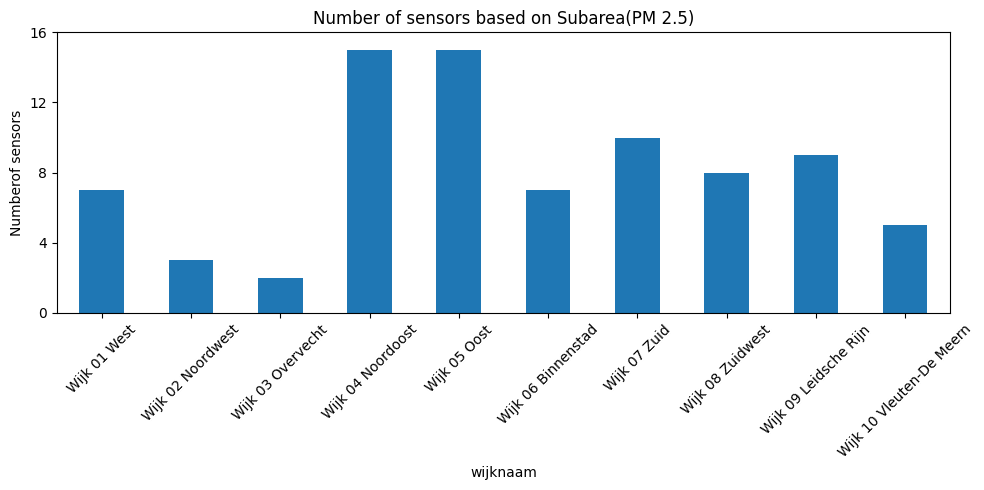

In [184]:
sum_plot3 = all_pm25_stations_df.groupby(['wijknaam']).size()

# Plot summary graph
sum_plot3.plot.bar(figsize=(10, 5))
y_range = range(0, (sum_plot3.max()+2), 4)
plt.yticks(y_range)
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on Subarea(PM 2.5)')
plt.tight_layout()
plt.savefig("chart/all_pm25_wijknaam.png")
plt.show()
plt.close()

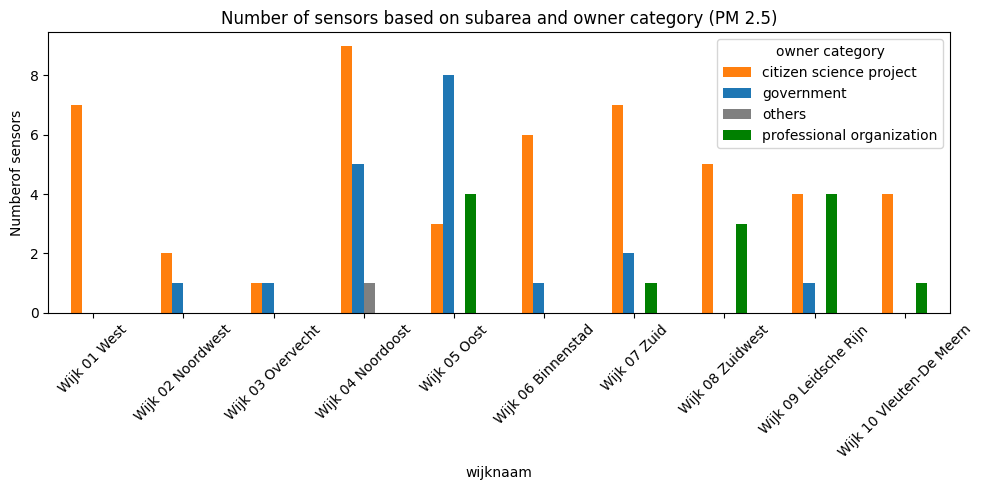

In [185]:
sum_plot4 = all_pm25_stations_df.groupby(['wijknaam','owner category']).size().unstack(fill_value=0)

# Plot summary graph
sum_plot4.plot.bar(figsize=(10, 5), color=['tab:orange', 'tab:blue', 'grey', 'green'])
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on subarea and owner category (PM 2.5)')
plt.tight_layout()
plt.savefig("chart/all_pm25_wijknaam_owner.png")
plt.show()
plt.close()

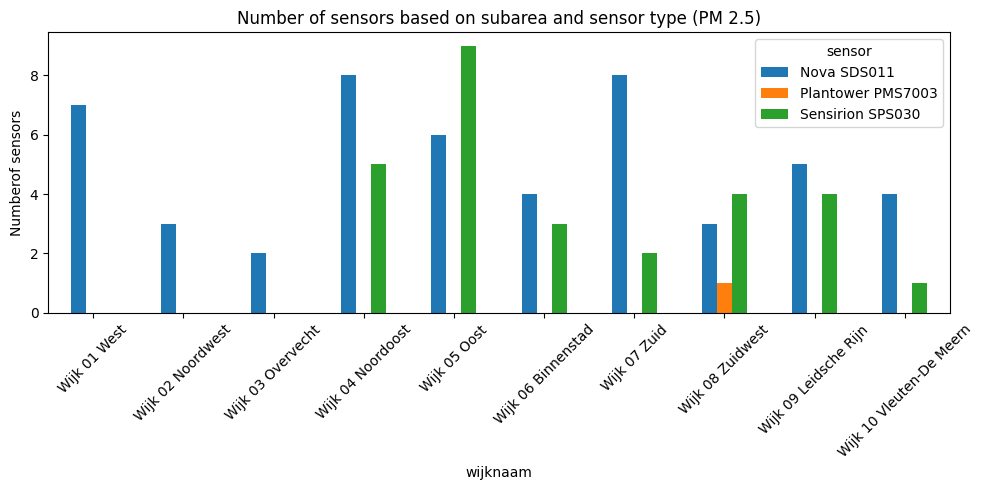

In [186]:
sum_plot6 = all_pm25_stations_df.groupby(['wijknaam','sensor']).size().unstack(fill_value=0)
# plot summary graph
sum_plot6.plot.bar(figsize=(10, 5))
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on subarea and sensor type (PM 2.5)')
plt.tight_layout()
plt.savefig("chart/all_pm25_wijknaam_sensors.png")
plt.show()
plt.close()

In [187]:
map = folium.Map(location=[all_pm25_stations_df['lat'].mean(), all_pm25_stations_df['lon'].mean()], tiles="OpenStreetMap", zoom_start=14)

for index, location_info in all_pm25_stations_df.iterrows():
    if location_info['owner'] in gov_owner:
        color = "blue"
        ownerct_val = owner_cat[0]
    elif location_info['owner'] in org_owner:
        color = "green"
        ownerct_val = owner_cat[1]
    elif location_info['owner'] in citizen_owner:
        color = "orange"
        ownerct_val = owner_cat[2]
    else:
        color = "lightgray"
        ownerct_val = owner_cat[3]

    folium.Marker([location_info['lat'], location_info['lon']], 
                  popup="<b>Thing name: </b>"
                  + location_info['name']
                  + "<br><b>Owner: </b>"
                  + location_info['owner'],
                  icon=folium.Icon(color=color)).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht subarea").add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)

folium.LayerControl().add_to(map)
map.save("map/pm25_stations_distribution.html")

map

#### NO2

In [188]:
nodup_no2_station_df.head()

,name,lat,lon,wijknaam,owner category,owner,sensor
0,SSK_USP02,52.085,5.169,Wijk 05 Oost,government,RIVM,Alphasense NO2
1,SSK_USP01,52.084,5.164,Wijk 05 Oost,government,RIVM,Alphasense NO2
3,SSK_USP04,52.085,5.176,Wijk 05 Oost,government,RIVM,Alphasense NO2
4,SSK_USP06,52.084,5.174,Wijk 05 Oost,government,RIVM,Alphasense NO2
5,SSK_USP05,52.085,5.172,Wijk 05 Oost,government,RIVM,Alphasense NO2


In [189]:
all_no2_stations_df = pd.concat([nodup_no2_station_df, lm_station_df])

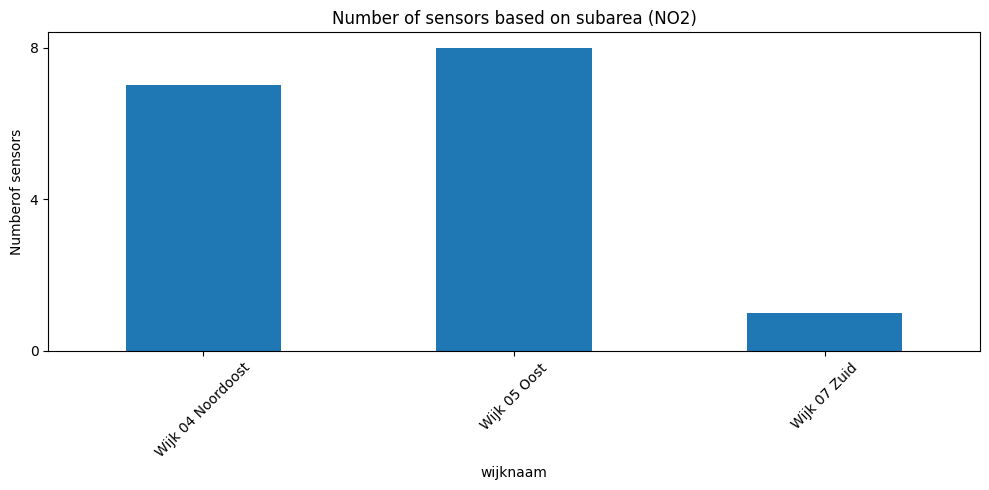

In [190]:
sum_plot5 = all_no2_stations_df.groupby(['wijknaam']).size()

# Plot summary graph
sum_plot5.plot.bar(figsize=(10, 5))
y_range = range(0, (sum_plot5.max()+2), 4)
plt.yticks(y_range)
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on subarea (NO2)')
plt.tight_layout()
plt.savefig("chart/all_no2_wijknaam.png")
plt.show()
plt.close()

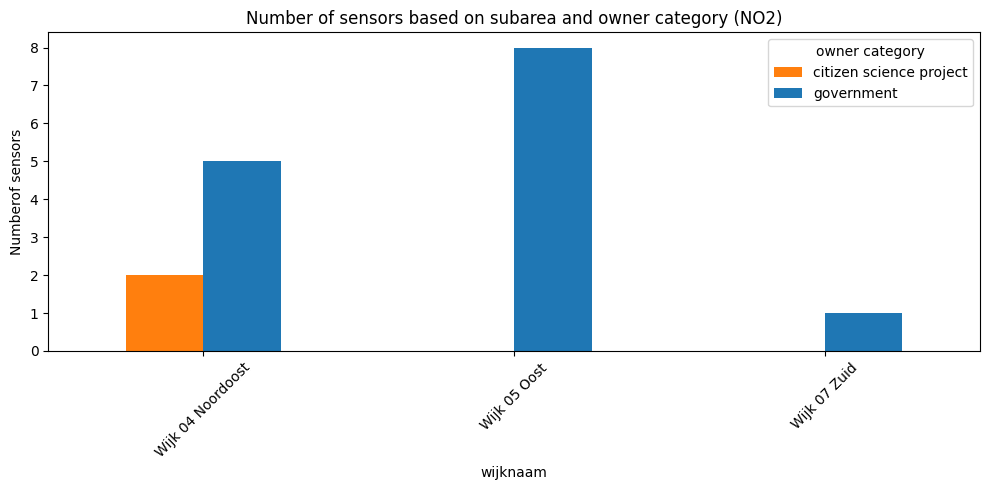

In [191]:
sum_plot6 = all_no2_stations_df.groupby(['wijknaam','owner category']).size().unstack(fill_value=0)

# Plot summary graph
sum_plot6.plot.bar(figsize=(10, 5), color=['tab:orange', 'tab:blue', 'grey', 'green'])
plt.xticks(rotation=45)
plt.ylabel('Numberof sensors')
plt.title('Number of sensors based on subarea and owner category (NO2)')
plt.tight_layout()
plt.savefig("chart/all_no2_wijknaam_owner.png")
plt.show()
plt.close()

In [192]:
map = folium.Map(location=[all_no2_stations_df['lat'].mean(), all_no2_stations_df['lon'].mean()], tiles="OpenStreetMap", zoom_start=14)

for index, location_info in all_no2_stations_df.iterrows():
    if location_info['owner'] in gov_owner:
        color = "blue"
        ownerct_val = owner_cat[0]
    elif location_info['owner'] in org_owner:
        color = "green"
        ownerct_val = owner_cat[1]
    elif location_info['owner'] in citizen_owner:
        color = "orange"
        ownerct_val = owner_cat[2]
    else:
        color = "lightgray"
        ownerct_val = owner_cat[3]

    folium.Marker([location_info['lat'], location_info['lon']], 
                  popup="<b>Thing name: </b>"
                  + location_info['name']
                  + "<br><b>Owner: </b>"
                  + location_info['owner'],
                  icon=folium.Icon(color=color)).add_to(map)

wijken = folium.GeoJson(utrecht_wijken_boundary, name="Utrecht boundary").add_to(map)
folium.GeoJsonTooltip(fields=["wijknaam"]).add_to(wijken)
folium.LayerControl().add_to(map)
map.save("map/no2_stations_distribution.html")

map